In [1]:
import numpy as np
import pandas as pd
import mne
import matplotlib.pyplot as plt
from mne.preprocessing import ICA
from mne.channels import make_standard_montage

# 1. File Loading and Preparation
# ----------------------------------------------------------------
# Load CSV data
data = pd.read_csv('20250626170254_MAYANK EEG 1_EEG MAIN STUDY.csv')  # Replace with your filename
sfreq = 500  # Sampling rate (Hz)

# Extract EEG data and convert to volts (nV → V)
eeg_data = data.iloc[:, :32].values.T * 1e-9  # (32 channels x samples)
ch_names = data.columns[:32].tolist()

# Extract events from Marker_Flag column
events = []
for i in range(len(data)):
    marker = data['Marker_Flag'].iloc[i]
    if marker > 0:  # Only consider non-zero markers
        events.append([i, 0, marker])
events = np.array(events)

# Create MNE info structure
montage = make_standard_montage('standard_1020')
info = mne.create_info(
    ch_names=ch_names,
    sfreq=sfreq,
    ch_types='eeg'
)
info.set_montage(montage)

# Create Raw object
raw = mne.io.RawArray(eeg_data, info)

Creating RawArray with float64 data, n_channels=32, n_times=471425
    Range : 0 ... 471424 =      0.000 ...   942.848 secs
Ready.


Using matplotlib as 2D backend.


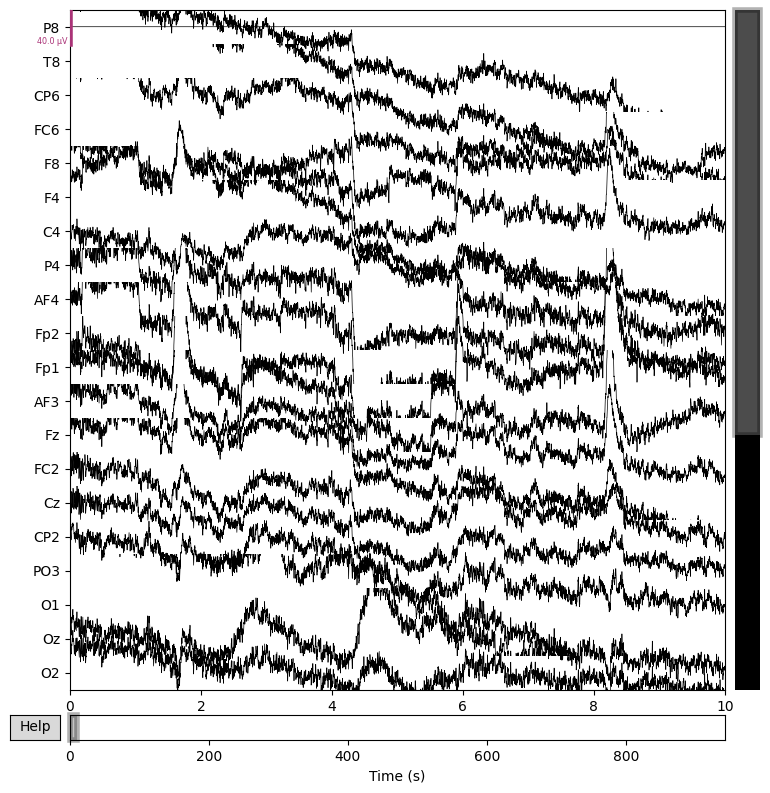

In [2]:
raw.plot();

In [3]:


# # 2. Preprocessing
# # ----------------------------------------------------------------
# # Apply filters
# raw.filter(0.1, 45, fir_design='firwin')  # Broadband for both ERP/PSD
# raw.notch_filter(50)  # Line noise removal

# # Set reference
# raw.set_eeg_reference('average', projection=False)

# # Artifact removal with ICA
# ica = mne.preprocessing.ICA(n_components=20, random_state=42, method='fastica')
# ica.fit(raw.copy())  # High-pass for ICA
# eog_inds, scores = ica.find_bads_eog(raw, ch_name=['Fp1', 'Fp2'])
# blink_indices, blink_scores = ica.find_bads_eog(raw)
# ica.exclude = eog_inds[:1] + blink_indices[:1]  # Exclude top artifacts
# ica.apply(raw)

# # 5. Rereferencing
# raw_erp.set_eeg_reference('average', projection=False)
# raw_psd.set_eeg_reference('average', projection=False)

# # # 6. Artifact Correction with ICA
# # ica = mne.preprocessing.ICA(n_components=20, random_state=42, method='fastica')
# # ica.fit(raw_erp)
# # # Automatically find EOG components (assuming channels labeled 'Fp1','Fp2')
# # eog_inds, scores = ica.find_bads_eog(raw_erp, ch_name=['Fp1', 'Fp2'])
# # ica.exclude = eog_inds
# # raw_erp_clean = ica.apply(raw_erp.copy())


# # Downsample to 250 Hz for ERP analysis
# raw_resampled = raw.copy().resample(250)



# 3. Filtering
raw_notch = raw.copy().notch_filter(freqs=50)
raw_erp = raw_notch.copy().filter(0.5, 30)
raw_psd = raw_notch.copy().filter(1, 45)

# 4. Downsampling (optional)
raw_erp.resample(250)
raw_psd.resample(250)

# 5. Rereferencing
raw_erp.set_eeg_reference('average', projection=False)
raw_psd.set_eeg_reference('average', projection=False)

# 6. Artifact Correction with ICA
ica = mne.preprocessing.ICA(n_components=30, random_state=42, method='fastica')
ica.fit(raw_erp)
# Automatically find EOG components (assuming channels labeled 'Fp1','Fp2')
eog_inds, scores = ica.find_bads_eog(raw_erp, ch_name=['Fp1', 'Fp2'])
ica.exclude = eog_inds
raw_erp_clean = ica.apply(raw_erp.copy())
raw_psd_clean = ica.apply(raw_erp.copy())




Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 3301 samples (6.602 s)

Filtering raw data in 1 contiguous segment


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.2s finished


Setting up band-pass filter from 0.5 - 30 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 30.00 Hz
- Upper transition bandwidth: 7.50 Hz (-6 dB cutoff frequency: 33.75 Hz)
- Filter length: 3301 samples (6.602 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.2s finished


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 1651 samples (3.302 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    0.3s finished


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Fitting ICA to data using 32 channels (please be patient, this may take a while)
Selecting by number: 30 components
Fitting ICA took 9.5s.
Using EOG channels: Fp1, Fp2
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
------------

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 2 ICA components
    Projecting back using 32 PCA components
Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 2 ICA components
    Projecting back using 32 PCA components


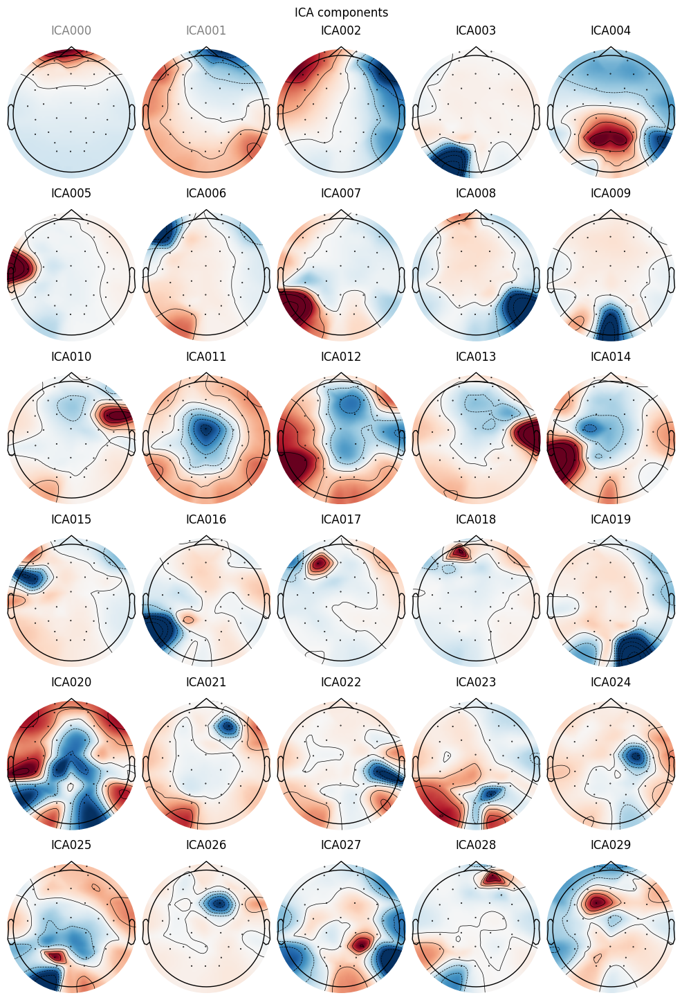

Creating RawArray with float64 data, n_channels=30, n_times=235712
    Range : 0 ... 235711 =      0.000 ...   942.844 secs
Ready.


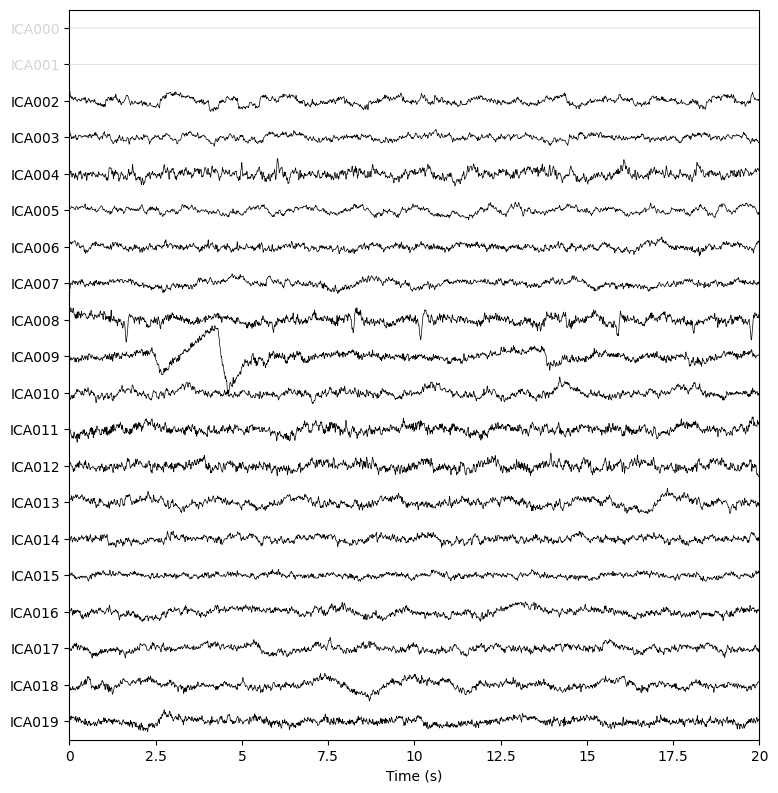

In [4]:
ica.plot_components(picks=range(ica.n_components_))
ica.plot_sources(raw_erp_clean, show_scrollbars=False);

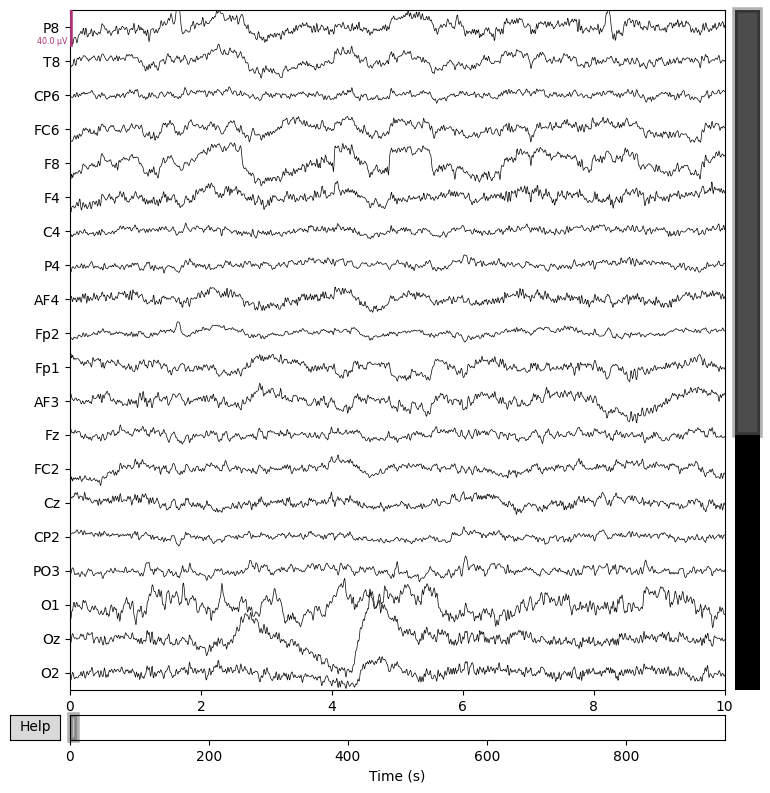

In [5]:
raw_erp_clean.plot();

In [6]:


# 3. Epoching and ERP Analysis
# ----------------------------------------------------------------
# Event dictionary based on trigger information
event_id = {
    'baseline': 1,
    'Triva': 2,
    'tasK_start': 3,
    'safe_option': 4,
    'win': 5,
    'loose': 6,
    'Reveal': 7,
    'Stop': 8
}

# Create epochs for each ERP component
# P300 epochs (markers 2,4,5,6)
p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[2, 4, 5, 6],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
)
# p300_epochs = p300_epochs['5','6']  # Only win/lose conditions


# # FRN epochs (markers 5,6,7)
# frn_epochs = mne.Epochs(
#     raw_erp_clean,
#     events,
#     event_id=[5, 6, 7],
#     tmin=-0.5,
#     tmax=0.6,
#     baseline=(-0.2, 0),
#     preload=True
# )


Not setting metadata
98 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 98 events and 501 original time points ...
52 bad epochs dropped


In [7]:
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


Surviving epochs: 46


In [8]:
import numpy as np

# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels = ['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 600.0 ms


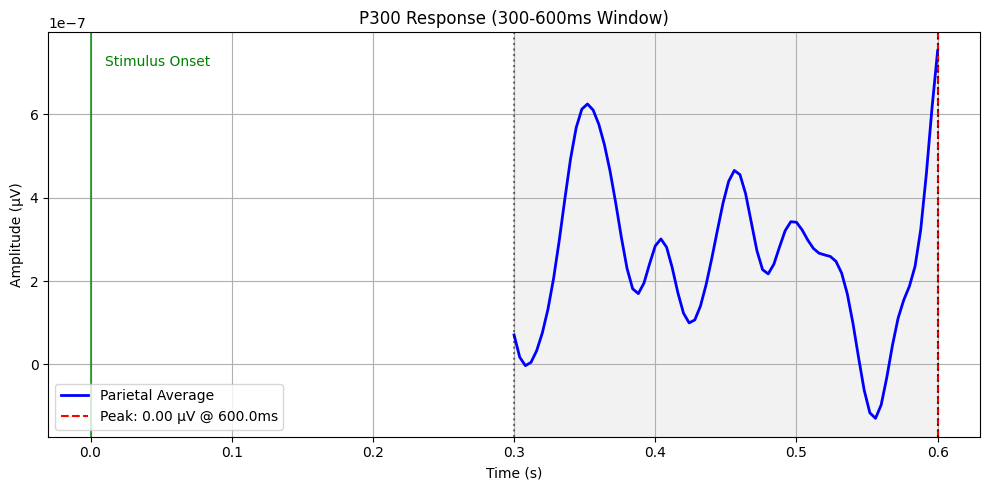

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Create evoked response (already averaged across trials)
evoked = p300_epochs.average()

# Select parietal channels
parietal_chans = ['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
evoked_parietal = evoked.copy().pick(parietal_chans)

# Average data across channels
channel_data = evoked_parietal.data  # Shape: (n_channels, n_times)
avg_data = np.mean(channel_data, axis=0)
times = evoked_parietal.times

# Find peak in 0.3-0.6s window
mask = (times >= 0.3) & (times <= 0.6)
window_times = times[mask]
window_data = avg_data[mask]

peak_idx = np.argmax(window_data)
peak_latency = window_times[peak_idx]
peak_amp = window_data[peak_idx]

# Plot the response
plt.figure(figsize=(10, 5))
plt.plot(window_times, window_data, linewidth=2, color='b', label='Parietal Average')
plt.axvline(peak_latency, color='r', linestyle='--', 
            label=f'Peak: {peak_amp:.2f} μV @ {peak_latency*1000:.1f}ms')
plt.title('P300 Response (300-600ms Window)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.legend()
plt.grid(True)

# Add analysis window and stimulus markers
plt.axvspan(0.3, 0.6, alpha=0.1, color='gray')
plt.axvline(0.3, color='k', linestyle=':', alpha=0.5)
plt.axvline(0.6, color='k', linestyle=':', alpha=0.5)
plt.axvline(0, color='g', linestyle='-', alpha=0.7, linewidth=1.5)
plt.text(0.01, plt.ylim()[1]*0.9, 'Stimulus Onset', color='g')

plt.tight_layout()
plt.show()

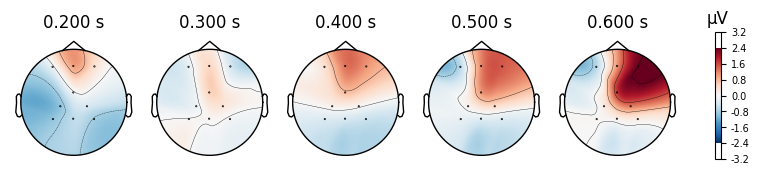

In [12]:
p300_evoked.plot_topomap(times=[0.2, 0.3, 0.4, 0.5,0.6], time_unit='s');


## 3 - 4 event bin 9 electrodes

Not setting metadata
74 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 74 events and 501 original time points ...
41 bad epochs dropped
Surviving epochs: 33


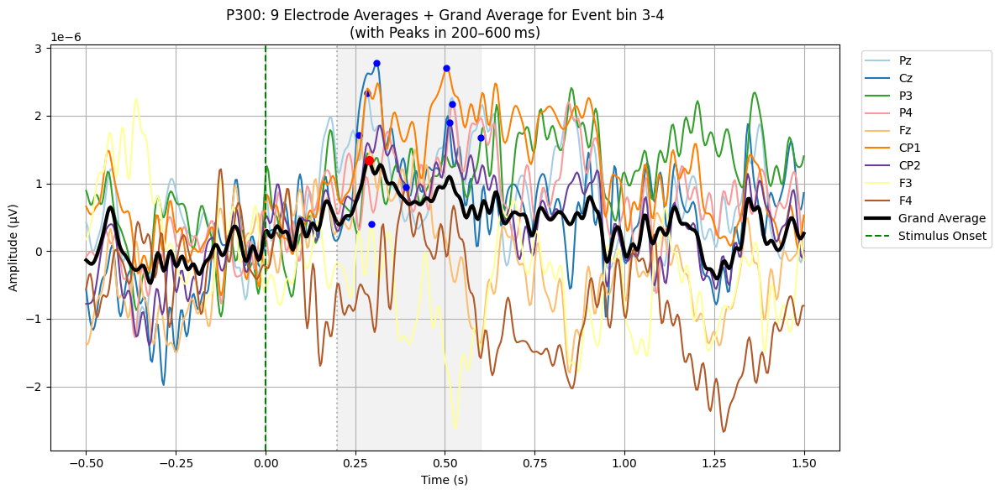

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 1.34 μV at 288.0 ms


In [ ]:
#3 - 4 for all electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[3, 4],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))






import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.2) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.2) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]


plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvline(0.2, color='gray', linestyle=':', alpha=0.5)
plt.axvspan(0.2, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 9 Electrode Averages + Grand Average for Event bin 3-4\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()





# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels = ['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx] *1e6
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")





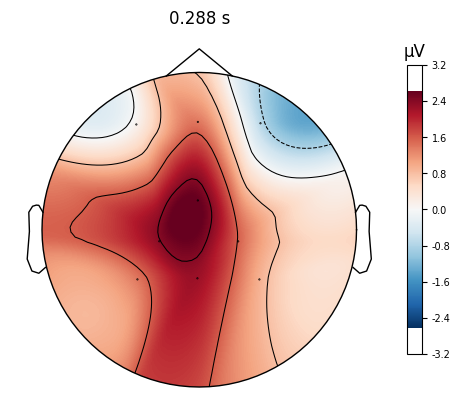

In [69]:
evoked_p300.plot_topomap(times=0.288, size=3, show=True);

## 3 - 4 Event bin 5 electrodes

Not setting metadata
74 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 74 events and 501 original time points ...
41 bad epochs dropped
Surviving epochs: 33


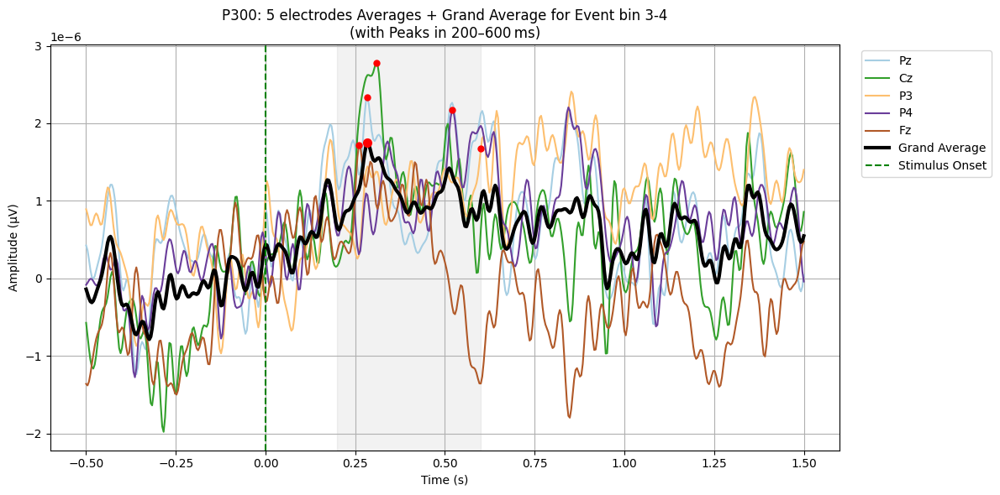

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 284.0 ms


In [70]:
#3 - 4 for 5 electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[3, 4],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4','Fz']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','Cz','P3','P4','Fz']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.2) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='red', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.2) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.2, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 5 electrodes Averages + Grand Average for Event bin 3-4\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels = ['Pz','Cz','P3','P4','Fz']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

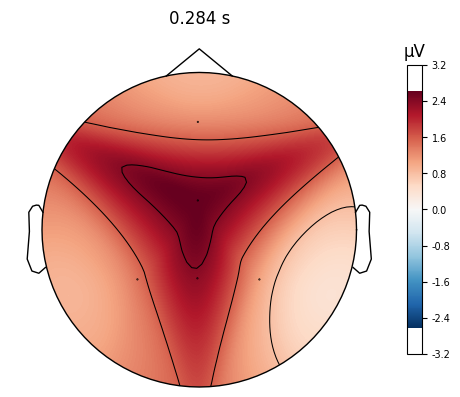

In [71]:
evoked_p300.plot_topomap(times=0.284, size=3, show=True);

## 3 -5 Event bin 9 electrodes

Not setting metadata
53 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 53 events and 501 original time points ...
28 bad epochs dropped
Surviving epochs: 25


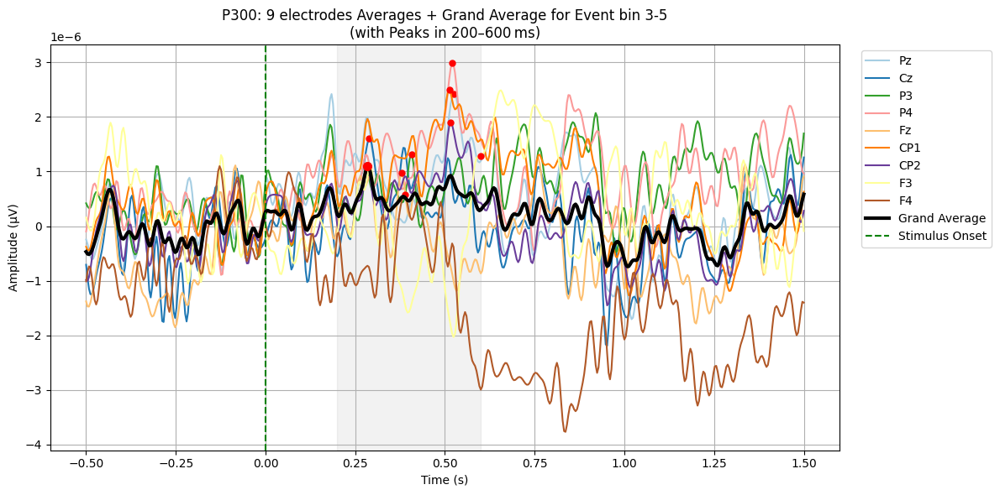

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 284.0 ms


In [72]:
#3 - 5 for 9 electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[3, 5],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.2) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='red', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.2) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.2, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 9 electrodes Averages + Grand Average for Event bin 3-5\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()



# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels = ['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

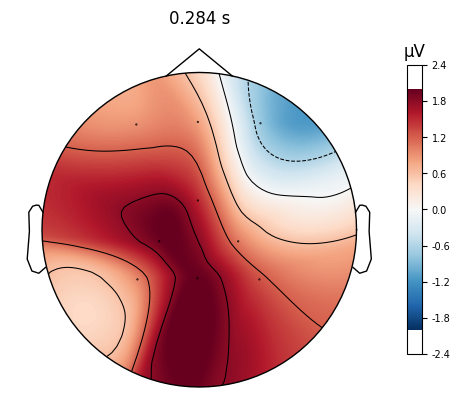

In [73]:
evoked_p300.plot_topomap(times=0.284, size=3, show=True);

## 3 -5 Event bin 5 electrodes 

Not setting metadata
53 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 53 events and 501 original time points ...
28 bad epochs dropped
Surviving epochs: 25


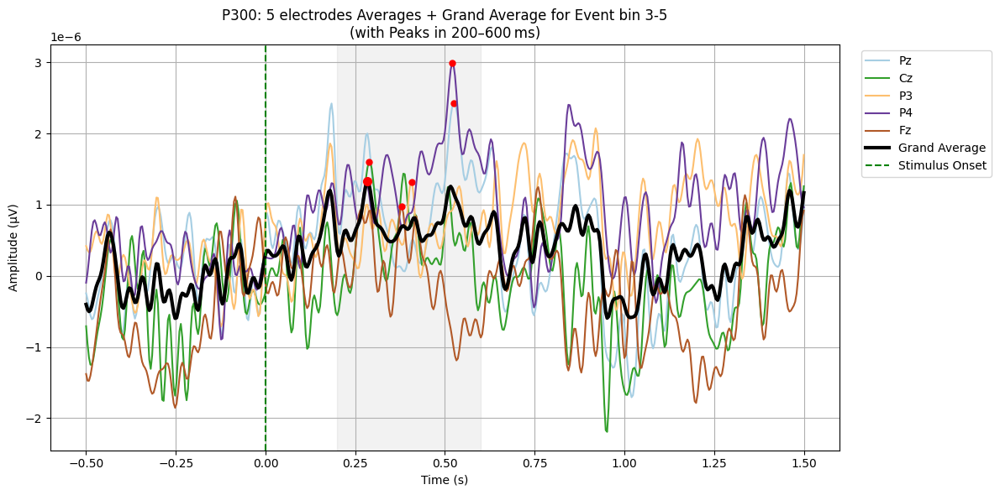

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 284.0 ms


In [74]:
#3 - 5 for 5 electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[3, 5],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4','Fz']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','Cz','P3','P4','Fz']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.2) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='red', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.2) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.2, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 5 electrodes Averages + Grand Average for Event bin 3-5\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()



# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels =['Pz','Cz','P3','P4','Fz']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

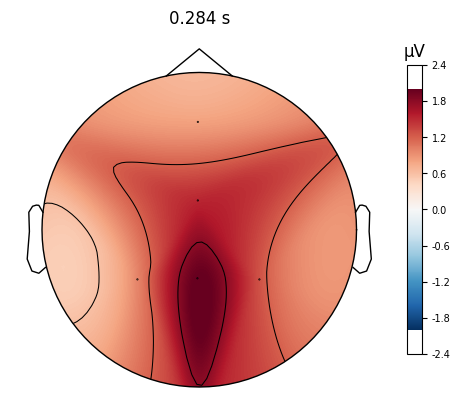

In [75]:
evoked_p300.plot_topomap(times=0.284, size=3, show=True);

## 3 -6 Event bin for 9 electrodes 

Not setting metadata
71 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 71 events and 501 original time points ...
37 bad epochs dropped
Surviving epochs: 34


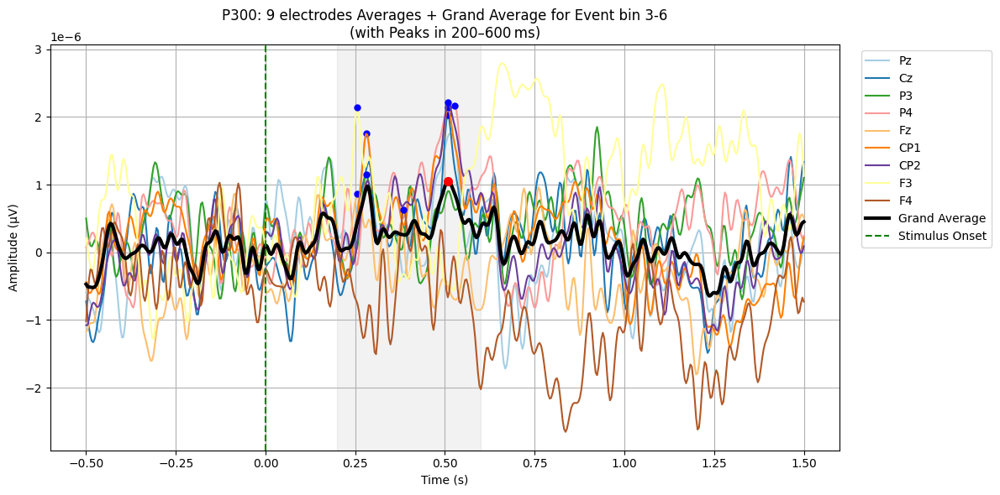

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 508.0 ms


In [17]:
#3 - 6 for 9 electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[3, 6],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.2) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.2) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.2, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 9 electrodes Averages + Grand Average for Event bin 3-6\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()




# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels =['Pz','Cz','P3','P4','Fz','CP1','CP2','F3','F4']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

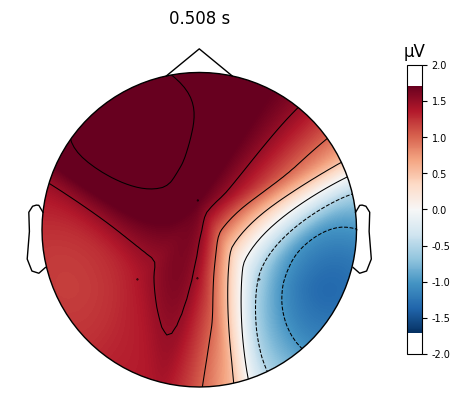

In [38]:
evoked_p300.plot_topomap(times=0.508, size=3, show=True);

Not setting metadata
24 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 24 events and 501 original time points ...
14 bad epochs dropped
Surviving epochs: 10


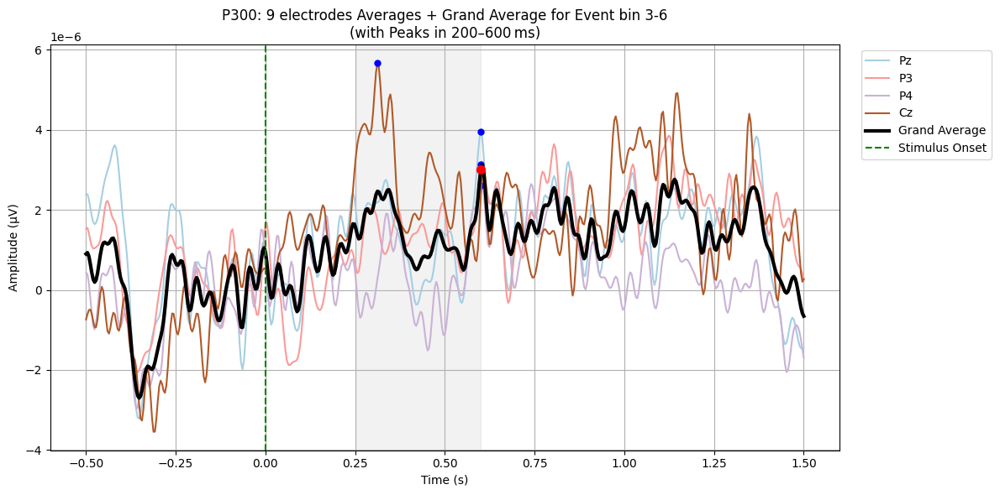

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 600.0 ms


In [36]:
#3 - 6 for 9 electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[4],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','P3','P4','Cz']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','P3','P4','Cz']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.25) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.25) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.25, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 9 electrodes Averages + Grand Average for Event bin 3-6\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()




# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels =['Pz','P3','P4','Cz']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.25, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

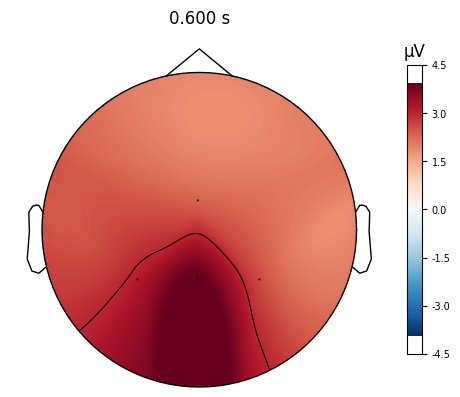

In [39]:
evoked_p300.plot_topomap(times=0.6, size=3, show=True);

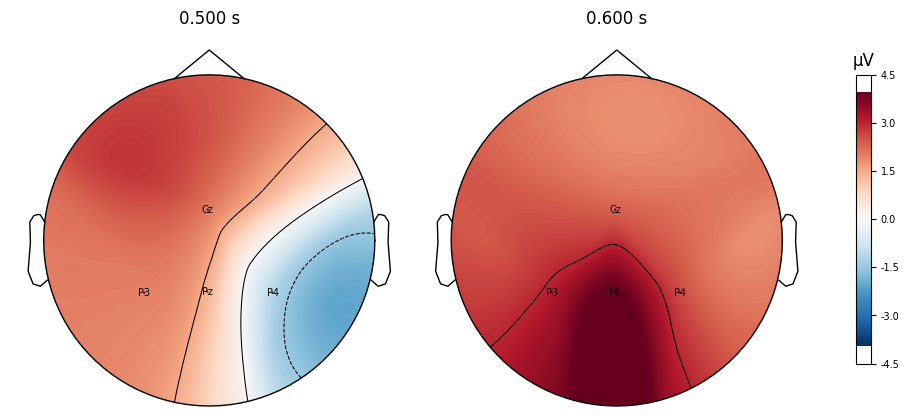

In [37]:
evoked_window.plot_topomap(times=[0.5,0.6 ], size=3, show=True, show_names=True,);

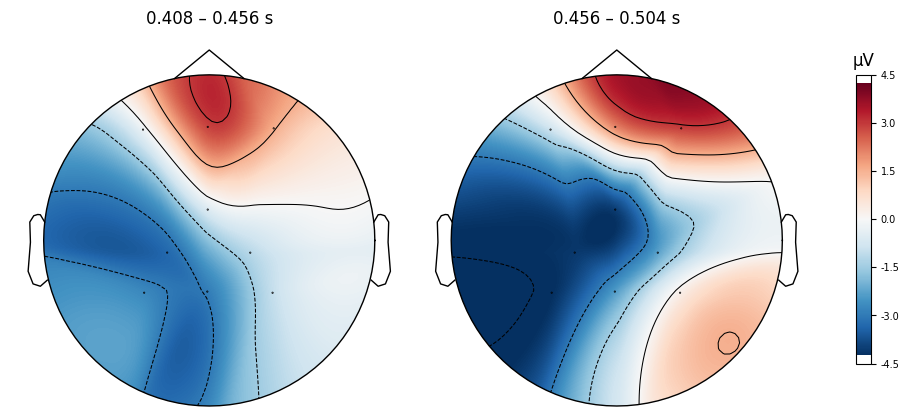

In [22]:
# times are in seconds
tmin, tmax = 0.430, 0.480

evoked_p300.plot_topomap(
    times=(tmin, tmax),   # average between these two
    ch_type='eeg',        # specify channel type if needed
    average=(tmax - tmin),# window width for smoothing: here full span
    size=3,
    show=True
);


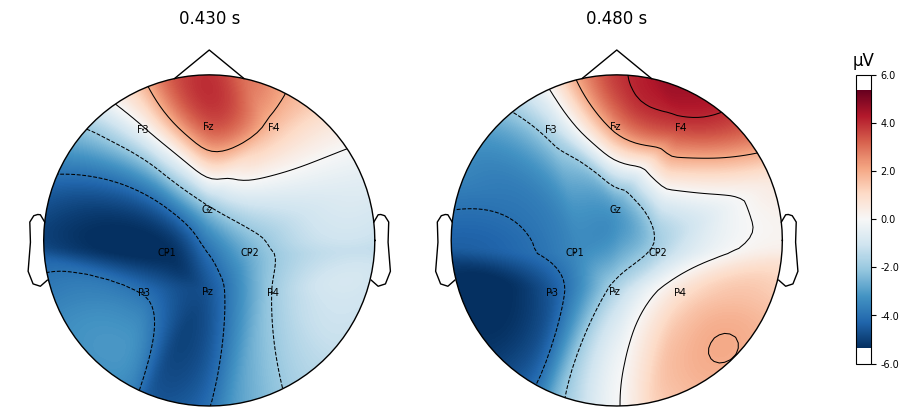

In [25]:
tmin, tmax= 0.43,0.48
evoked_p300.plot_topomap(times=(tmin, tmax), size=3, show=True, show_names=True,);

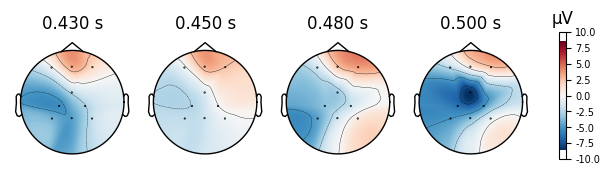

In [26]:
evoked_p300.plot_topomap(times=[0.43, 0.45, 0.48, 0.5], time_unit='s');

## 3-6 event bin for 5 electrodes 

Not setting metadata
71 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 71 events and 501 original time points ...
37 bad epochs dropped
Surviving epochs: 34


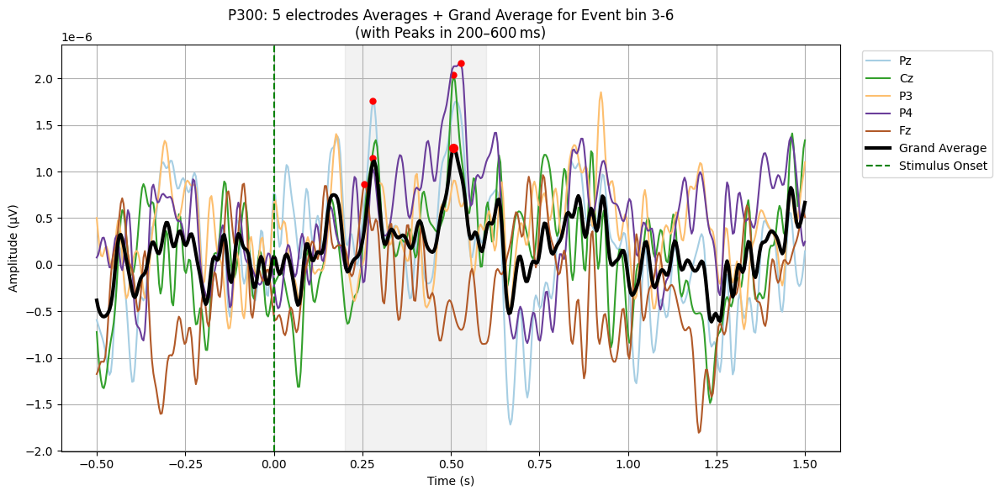

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 508.0 ms


In [78]:
#3 - 6 for 5 electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[3, 6],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4','Fz']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','Cz','P3','P4','Fz']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.2) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='red', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.2) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.2, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 5 electrodes Averages + Grand Average for Event bin 3-6\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels =['Pz','Cz','P3','P4','Fz']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

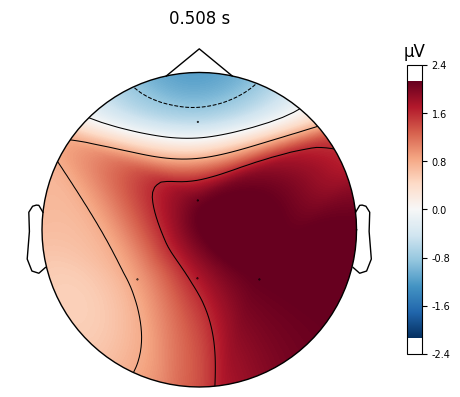

In [79]:
evoked_p300.plot_topomap(times=0.508, size=3, show=True);

## 3 -6 Event bin for 4 electrodes 

Not setting metadata
71 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 71 events and 501 original time points ...
37 bad epochs dropped
Surviving epochs: 34


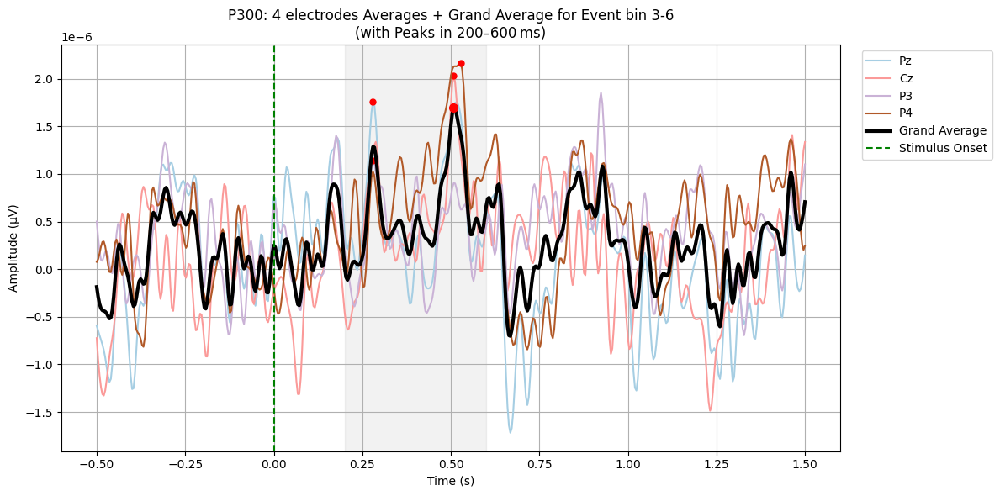

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
P300 Peak: 0.00 μV at 508.0 ms


In [82]:
#3 - 6 for 4 electrodes

p300_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[3, 6],
    tmin=-0.5,
    tmax=1.5,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','P3','P4']
)
p300_epochs.drop_bad()
print("Surviving epochs:", len(p300_epochs))


import matplotlib.pyplot as plt
import numpy as np

# Your 9 channels
parietal_chans = ['Pz','Cz','P3','P4']
epochs9 = p300_epochs.copy().pick(parietal_chans)

# Get data (n_epochs, n_channels, n_times) and times
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per-channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (9, n_times)

# 2) Compute grand average across those 9 channels
grand_avg = np.mean(avg_per_chan, axis=0)  # shape: (n_times,)

# Color map for the 9 channels
# colors = plt.cm.viridis(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.Set1(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab10(np.linspace(0, 1, len(parietal_chans)))
# colors = plt.cm.tab20(np.linspace(0, 1, len(parietal_chans)))
colors = plt.cm.Paired(np.linspace(0, 1, len(parietal_chans)))

plt.figure(figsize=(12, 6))

# Plot each channel
for i, ch in enumerate(parietal_chans):
    wv = avg_per_chan[i]
    # find peak in P300 window
    mask = (times >= 0.2) & (times <= 0.6)
    win_t = times[mask]
    win_d = wv[mask]
    pk_idx = np.argmax(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='red', markersize=5)

# Plot grand average
# find its peak
mask = (times >= 0.2) & (times <= 0.6)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmax(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg,
         color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=7)

# Stimulus and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.2, 0.6, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('P300: 4 electrodes Averages + Grand Average for Event bin 3-6\n(with Peaks in 200–600 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()




# 1. Create evoked response by averaging epochs
evoked_p300 = p300_epochs.average()

# 2. Select parietal channels (P300 maximum)
parietal_channels =['Pz','Cz','P3','P4']
evoked_parietal = evoked_p300.pick_channels(parietal_channels)

# 3. Define P300 time window (250-500ms)
tmin, tmax = 0.2, 0.6  # seconds
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# 4. Find peak in the averaged signal
data = evoked_window.data.mean(axis=0)  # average across channels
times = evoked_window.times
peak_idx = np.argmax(data)  # P300 is positive component
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # convert to ms

print(f"P300 Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")

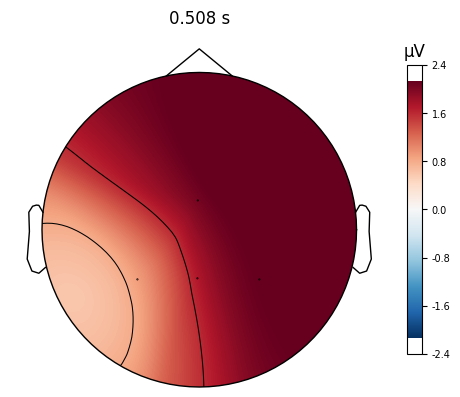

In [83]:
evoked_p300.plot_topomap(times=0.508, size=3, show=True);

Not setting metadata
24 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 24 events and 251 original time points ...
14 bad epochs dropped
Not setting metadata
3 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 3 events and 251 original time points ...
1 bad epochs dropped
Not setting metadata
21 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 21 events and 251 original time points ...
10 bad epochs dropped
Not setting metadata
2 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 2 events and 251 original time points ...
1 bad epochs dropped


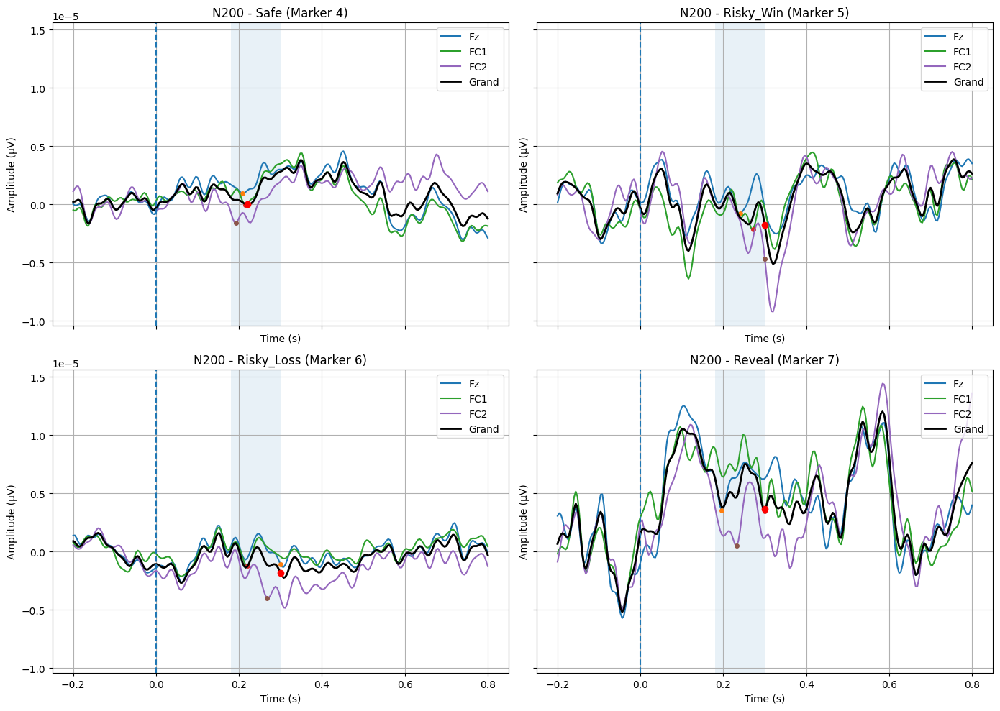

Not setting metadata
24 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 24 events and 251 original time points ...
14 bad epochs dropped
Condition: safe
  Fz: 0.00 µV at 208.0 ms
  FC1: -0.00 µV at 216.0 ms
  FC2: -0.00 µV at 192.0 ms
  grand: -0.00 µV at 220.0 ms
Not setting metadata
3 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 3 events and 251 original time points ...
1 bad epochs dropped
Condition: risky_win
  Fz: -0.00 µV at 240.0 ms
  FC1: -0.00 µV at 272.0 ms
  FC2: -0.00 µV at 300.0 ms
  grand: -0.00 µV at 300.0 ms
Not setting metadata
21 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 21 events and 251 original time points ...
10 bad epochs dropped
Condition: risky_loss
  Fz: -0.00 µV at 300.0 ms
  FC1: -0.00 µV at 220.0 ms
  FC2: -0.00 µV 

In [30]:
import mne
import numpy as np
import matplotlib.pyplot as plt

# Define settings
event_bins = {
    'safe': 4,
    'risky_win': 5,
    'risky_loss': 6,
    'reveal': 7
}
channels_7 = ['Pz', 'Cz', 'FC1', 'FC2', 'Fz', 'CP1', 'CP2']
channels_4 = ['Fz', 'FC1', 'FC2']

def compute_n200(raw, events, event_id, picks, tmin=-0.2, tmax=0.8,
                 baseline=(-0.2, 0), peak_window=(0.18, 0.3)):
    # Extract epochs
    epochs = mne.Epochs(raw, events, event_id=[event_id], tmin=tmin,
                        tmax=tmax, baseline=baseline,
                        preload=True, picks=picks)
    epochs.drop_bad()
    data = epochs.get_data()  # shape: (n_epochs, n_channels, n_times)
    times = epochs.times

    # Per-channel average waveform
    avg_per_chan = np.mean(data, axis=0)
    # Grand average across channels
    grand_avg = np.mean(avg_per_chan, axis=0)

    # Find negative peaks
    mask = (times >= peak_window[0]) & (times <= peak_window[1])
    t_win = times[mask]

    peaks = {}
    for idx, ch in enumerate(picks):
        wv = avg_per_chan[idx]
        sub = wv[mask]
        peak_idx = np.argmin(sub)
        peaks[ch] = (t_win[peak_idx], sub[peak_idx])

    # Grand peak
    g_sub = grand_avg[mask]
    g_idx = np.argmin(g_sub)
    peaks['grand'] = (t_win[g_idx], g_sub[g_idx])

    return times, avg_per_chan, grand_avg, peaks

# Plotting
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=True, sharey=True)
axes = axes.flatten()

for ax, (cond, marker) in zip(axes, event_bins.items()):
    times, avg_per_chan, grand_avg, peaks = compute_n200(
        raw_erp_clean, events, marker, channels_4)

    # Plot each channel
    for idx, ch in enumerate(channels_4):
        ax.plot(times, avg_per_chan[idx], label=ch)
        # Mark negative peak
        t_pk, a_pk = peaks[ch]
        ax.plot(t_pk, a_pk, 'o', markersize=4)

    # Plot grand
    ax.plot(times, grand_avg, color='k', linewidth=2, label='Grand')
    t_g, a_g = peaks['grand']
    ax.plot(t_g, a_g, 'o', color='r', markersize=6)

    # Onset and window
    ax.axvline(0, linestyle='--')
    ax.axvspan(0.18, 0.3, alpha=0.1)
    ax.set_title(f"N200 - {cond.title()} (Marker {marker})")
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitude (µV)')
    ax.legend(loc='upper right')
    ax.grid(True)

plt.tight_layout()
plt.show()

# Summary printout
for cond, marker in event_bins.items():
    _, _, _, peaks = compute_n200(raw_erp_clean, events, marker, channels_4)
    print(f"Condition: {cond}")
    for ch in channels_4 + ['grand']:
        t, a = peaks[ch]
        print(f"  {ch}: {a:.2f} µV at {t*1000:.1f} ms")


In [13]:
event_id = {
    'baseline': 1,
    'Triva': 2,
    'tasK_start': 3,
    'safe_option': 4,
    'win': 5,
    'loose': 6,
    'Reveal': 7,
    'Stop': 8
}

## N200 Epoching 

# 7 electrodes

Not setting metadata
200 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 200 events and 251 original time points ...
107 bad epochs dropped
Surviving epochs: 93


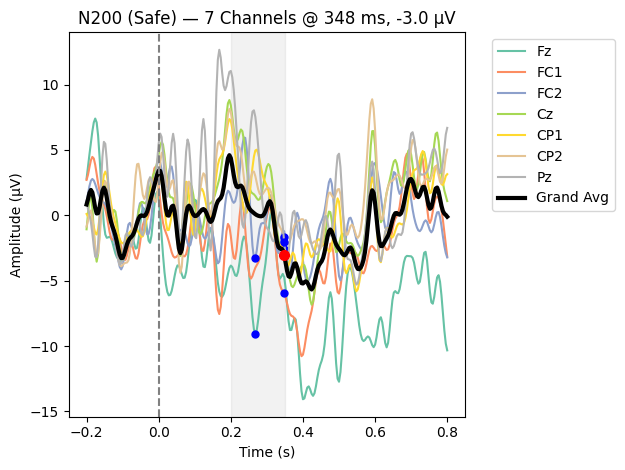

=== Safe (Event 4) N200 peaks ===
   Fz:  268.0 ms,  -9.1 µV
  FC1:  348.0 ms,  -6.0 µV
  FC2:  268.0 ms,  -3.3 µV
   Cz:  348.0 ms,  -2.5 µV
  CP1:  348.0 ms,  -3.1 µV
  CP2:  348.0 ms,  -1.7 µV
   Pz:  348.0 ms,  -2.1 µV
Grand:  348.0 ms,  -3.0 µV

Plotting topomap for Safe at 348.0 ms


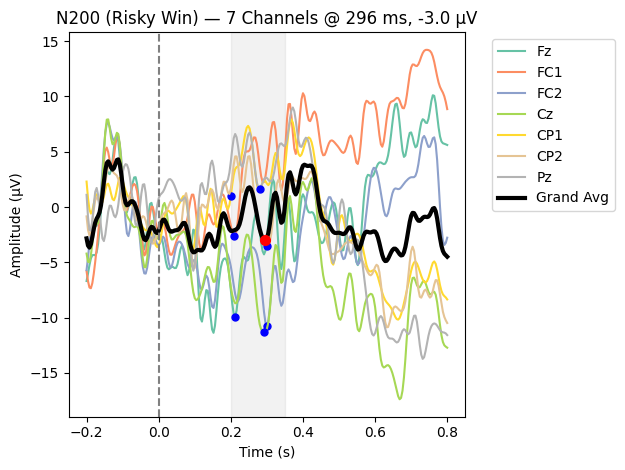

=== Risky Win (Event 5) N200 peaks ===
   Fz:  212.0 ms,  -9.9 µV
  FC1:  208.0 ms,  -2.6 µV
  FC2:  300.0 ms, -10.8 µV
   Cz:  292.0 ms, -11.3 µV
  CP1:  200.0 ms,   1.0 µV
  CP2:  300.0 ms,  -3.5 µV
   Pz:  280.0 ms,   1.6 µV
Grand:  296.0 ms,  -3.0 µV

Plotting topomap for Risky Win at 296.0 ms


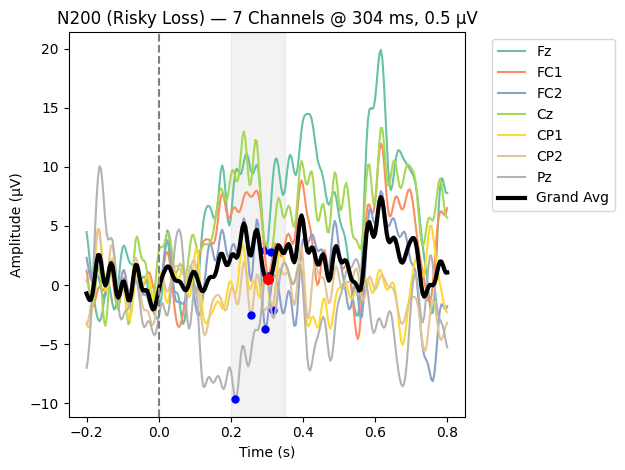

=== Risky Loss (Event 6) N200 peaks ===
   Fz:  296.0 ms,   3.0 µV
  FC1:  304.0 ms,   0.8 µV
  FC2:  296.0 ms,  -3.7 µV
   Cz:  312.0 ms,   2.8 µV
  CP1:  316.0 ms,  -2.1 µV
  CP2:  256.0 ms,  -2.6 µV
   Pz:  212.0 ms,  -9.7 µV
Grand:  304.0 ms,   0.5 µV

Plotting topomap for Risky Loss at 304.0 ms


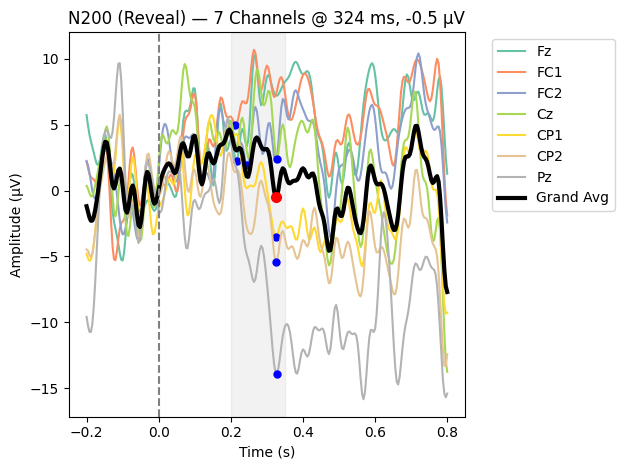

=== Reveal (Event 7) N200 peaks ===
   Fz:  216.0 ms,   2.2 µV
  FC1:  212.0 ms,   5.0 µV
  FC2:  244.0 ms,   1.9 µV
   Cz:  328.0 ms,   2.4 µV
  CP1:  324.0 ms,  -3.5 µV
  CP2:  324.0 ms,  -5.4 µV
   Pz:  328.0 ms, -13.9 µV
Grand:  324.0 ms,  -0.5 µV

Plotting topomap for Reveal at 324.0 ms


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import mne

# N200 epochs bin 1 7 electrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    # event_id=[4, 5, 6, 7],
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Fz', 'FC1', 'FC2', 'Cz', 'CP1', 'CP2', 'Pz']
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))

# Define event bins and channel sets
event_bins = {
    4: 'Safe',
    5: 'Risky Win',
    6: 'Risky Loss',
    7: 'Reveal'
}
chs7 = ['Fz', 'FC1', 'FC2', 'Cz', 'CP1', 'CP2', 'Pz']
# N200 time window (in seconds)
tmin, tmax = 0.2, 0.35

# Color map for plotting
tcm = plt.cm.Set2(np.linspace(0, 1, len(chs7)))

for event_id, name in event_bins.items():
    epochs_bin = n200_epochs[event_id].copy().pick(chs7)
    evoked = epochs_bin.average()

    # Convert data from V to µV
    data_uv = evoked.data * 1e6  # shape: (n_channels, n_times)
    times = evoked.times
    mask = (times >= tmin) & (times <= tmax)
    win_times = times[mask]

    # Plot timecourses and find peaks\ n    plt.figure(figsize=(10, 5))
    pk_times = {}
    pk_amps = {}
    for idx, ch in enumerate(chs7):
        wv_uv = data_uv[idx]
        win_wv = wv_uv[mask]
        # Negative peak in µV
        idx_min = np.argmin(win_wv)
        t_peak = win_times[idx_min]
        a_peak = win_wv[idx_min]
        pk_times[ch] = t_peak
        pk_amps[ch] = a_peak
        plt.plot(times, wv_uv, label=ch, color=tcm[idx], lw=1.5)
        plt.plot(t_peak, a_peak, 'o', color='blue', ms=5)

    # Grand average across channels in µV
    grand_uv = data_uv.mean(axis=0)
    grand_win = grand_uv[mask]
    g_idx = np.argmin(grand_win)
    g_t = win_times[g_idx]
    g_a = grand_win[g_idx]
    plt.plot(times, grand_uv, color='k', lw=3, label='Grand Avg')
    plt.plot(g_t, g_a, 'o', color='red', ms=7)

    # Beautify
    plt.axvline(0, color='gray', ls='--')
    plt.axvspan(tmin, tmax, color='gray', alpha=0.1)
    plt.title(f'N200 ({name}) — 7 Channels @ {int(g_t*1e3)} ms, {g_a:.1f} µV')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Report peaks
    print(f"=== {name} (Event {event_id}) N200 peaks ===")
    for ch in chs7:
        print(f"  {ch:>3}: {pk_times[ch]*1e3:6.1f} ms, {pk_amps[ch]:5.1f} µV")
    print(f"Grand: {g_t*1e3:6.1f} ms, {g_a:5.1f} µV\n")



        # 5) Plot topomap at N200 grand average peak
    print(f"Plotting topomap for {name} at {g_t*1e3:.1f} ms")
    # Topomap at grand-avg peak\ n    print(f"Plotting topomap for {name} at {g_t*1e3:.1f} ms")
    # Note: evoked.data is still in V, so we convert here
    # evoked_uv = evoked.copy().apply_function(lambda x: x * 1e6)
    # evoked_uv.plot_topomap(
    #     times=[g_t],
    #     ch_type='eeg',
    #     size=3,
    #     show_names=True,
    #     show=True
    # )

# To run the 4-channel subset, repeat with chs4 instead of chs7.


Not setting metadata
50 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 50 events and 251 original time points ...
26 bad epochs dropped
Surviving epochs: 24


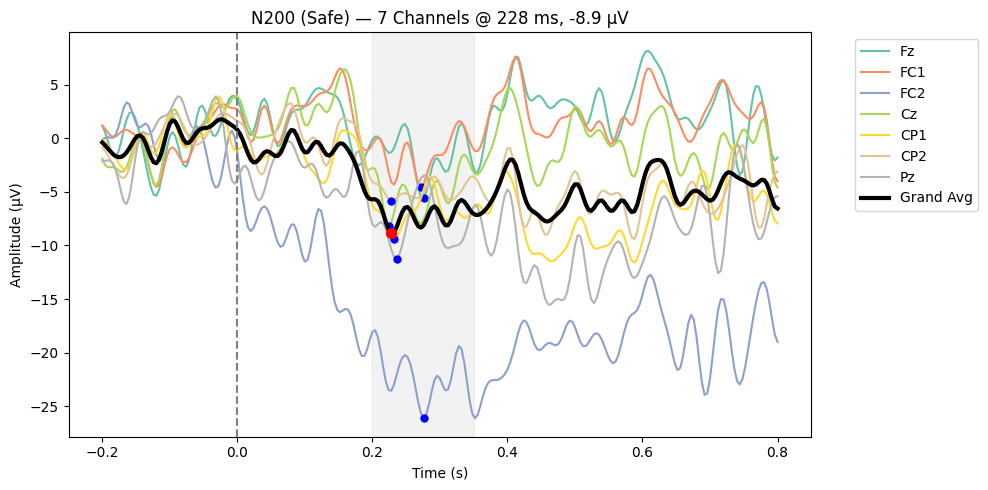

=== Safe (Event 4) N200 peaks ===
   Fz:  276.0 ms,  -5.6 µV
  FC1:  272.0 ms,  -4.5 µV
  FC2:  276.0 ms, -26.1 µV
   Cz:  224.0 ms,  -8.1 µV
  CP1:  232.0 ms,  -9.4 µV
  CP2:  228.0 ms,  -5.8 µV
   Pz:  236.0 ms, -11.2 µV
Grand:  228.0 ms,  -8.9 µV

Plotting single-point topomap for Safe at 228.0 ms


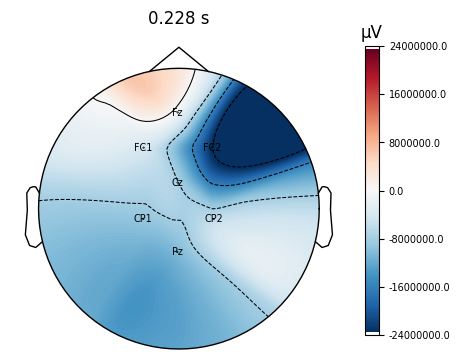

Plotting range-based topomap for Safe over 200–350 ms


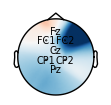

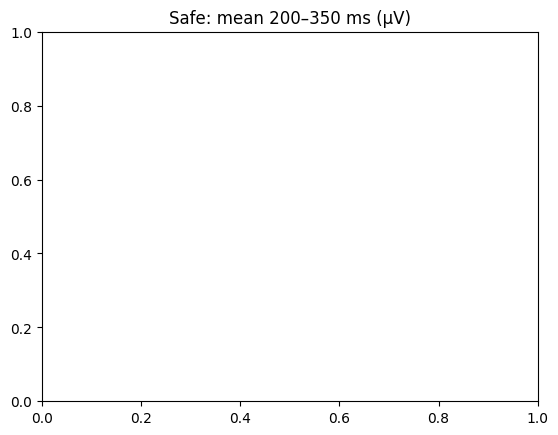

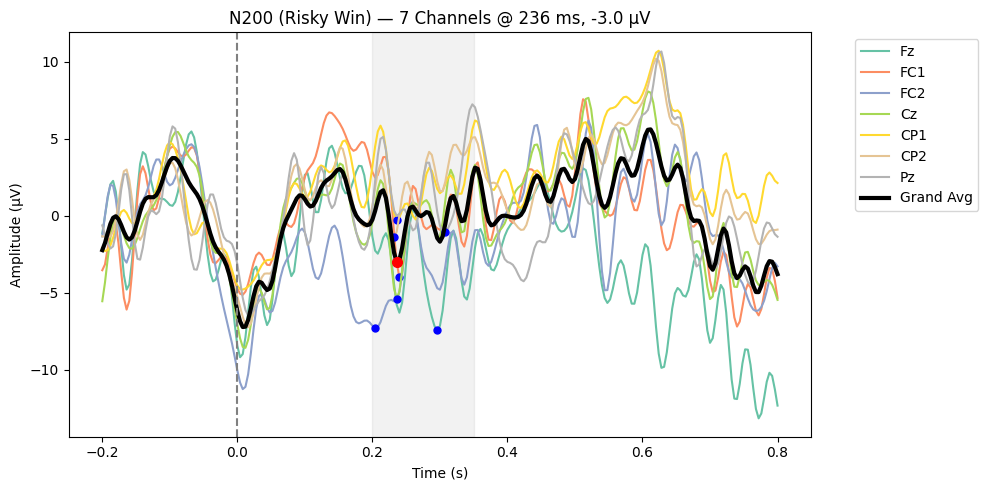

=== Risky Win (Event 5) N200 peaks ===
   Fz:  296.0 ms,  -7.4 µV
  FC1:  240.0 ms,  -4.0 µV
  FC2:  204.0 ms,  -7.3 µV
   Cz:  236.0 ms,  -5.4 µV
  CP1:  236.0 ms,  -0.3 µV
  CP2:  232.0 ms,  -1.4 µV
   Pz:  308.0 ms,  -1.1 µV
Grand:  236.0 ms,  -3.0 µV

Plotting single-point topomap for Risky Win at 236.0 ms


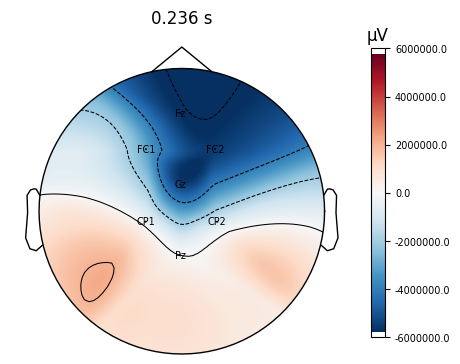

Plotting range-based topomap for Risky Win over 200–350 ms


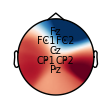

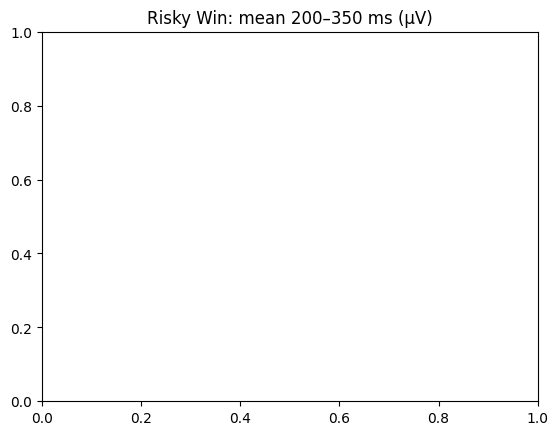

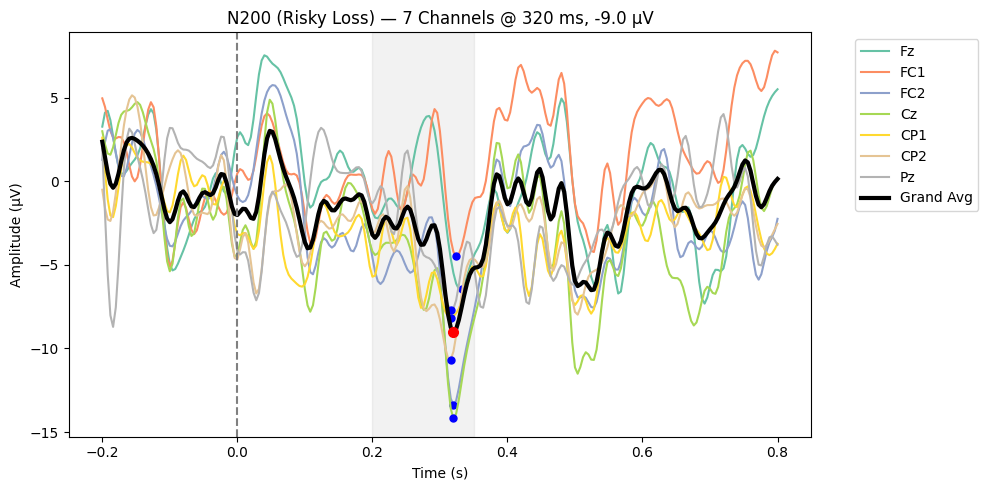

=== Risky Loss (Event 6) N200 peaks ===
   Fz:  332.0 ms,  -6.5 µV
  FC1:  324.0 ms,  -4.5 µV
  FC2:  320.0 ms, -13.4 µV
   Cz:  320.0 ms, -14.2 µV
  CP1:  316.0 ms,  -8.1 µV
  CP2:  316.0 ms, -10.7 µV
   Pz:  316.0 ms,  -7.7 µV
Grand:  320.0 ms,  -9.0 µV

Plotting single-point topomap for Risky Loss at 320.0 ms


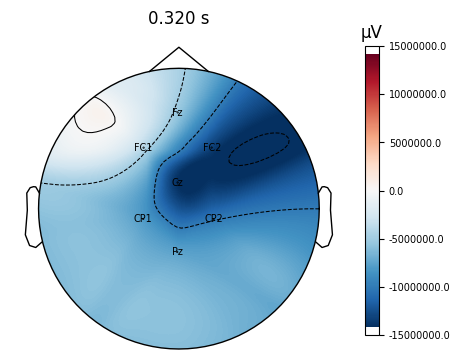

Plotting range-based topomap for Risky Loss over 200–350 ms


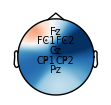

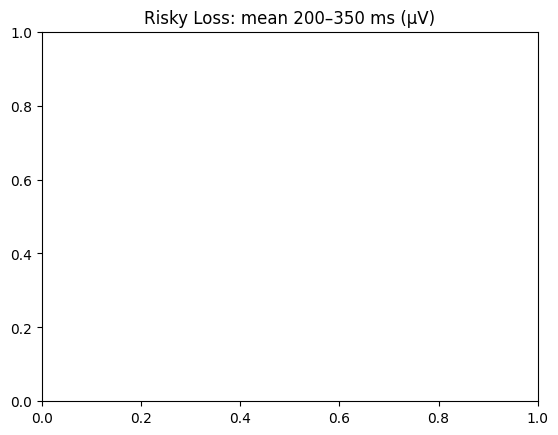

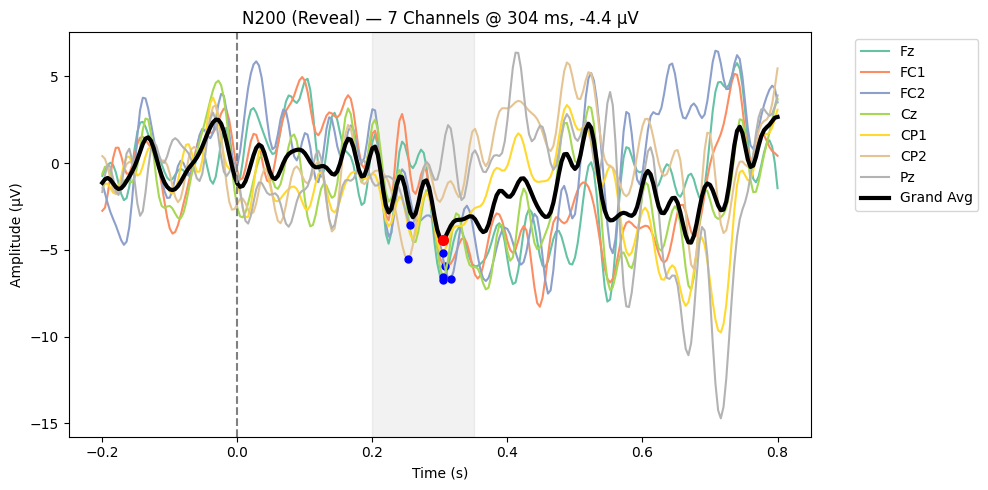

=== Reveal (Event 7) N200 peaks ===
   Fz:  304.0 ms,  -6.7 µV
  FC1:  308.0 ms,  -5.9 µV
  FC2:  316.0 ms,  -6.7 µV
   Cz:  304.0 ms,  -6.5 µV
  CP1:  304.0 ms,  -5.2 µV
  CP2:  252.0 ms,  -5.5 µV
   Pz:  256.0 ms,  -3.6 µV
Grand:  304.0 ms,  -4.4 µV

Plotting single-point topomap for Reveal at 304.0 ms


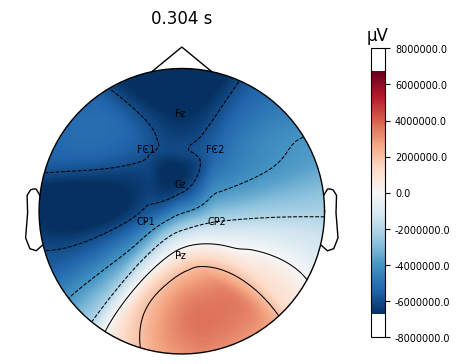

Plotting range-based topomap for Reveal over 200–350 ms


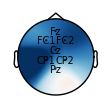

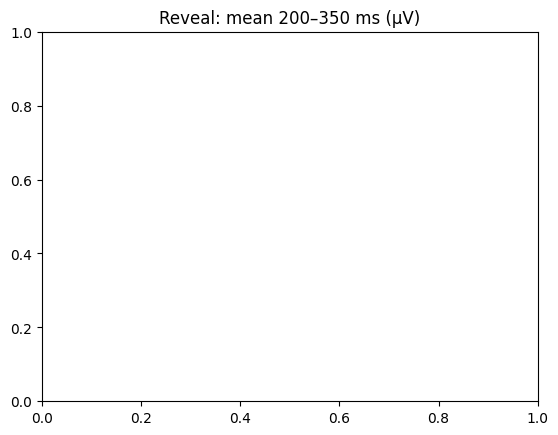

In [15]:
import matplotlib.pyplot as plt
import numpy as np
import mne

# N200 epochs for bins 4,5,6,7 and 7 electrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[4, 5, 6, 7],
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Fz', 'FC1', 'FC2', 'Cz', 'CP1', 'CP2', 'Pz']
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))

# Define event bins and channel sets
event_bins = {
    4: 'Safe',
    5: 'Risky Win',
    6: 'Risky Loss',
    7: 'Reveal'
}
chs7 = ['Fz', 'FC1', 'FC2', 'Cz', 'CP1', 'CP2', 'Pz']
# N200 time window (in seconds)
tmin, tmax = 0.2, 0.35

# Color map for plotting
tcm = plt.cm.Set2(np.linspace(0, 1, len(chs7)))

for event_id, name in event_bins.items():
    epochs_bin = n200_epochs[event_id].copy().pick(chs7)
    evoked = epochs_bin.average()

    # Convert data from V to µV
    data_uv = evoked.data * 1e6  # shape: (n_channels, n_times)
    times = evoked.times
    mask = (times >= tmin) & (times <= tmax)
    win_times = times[mask]

    # Plot timecourses and find peaks
    plt.figure(figsize=(10, 5))
    pk_times = {}
    pk_amps = {}
    for idx, ch in enumerate(chs7):
        wv_uv = data_uv[idx]
        win_wv = wv_uv[mask]
        idx_min = np.argmin(win_wv)
        t_peak = win_times[idx_min]
        a_peak = win_wv[idx_min]
        pk_times[ch] = t_peak
        pk_amps[ch] = a_peak
        plt.plot(times, wv_uv, label=ch, color=tcm[idx], lw=1.5)
        plt.plot(t_peak, a_peak, 'o', color='blue', ms=5)

    # Grand average across channels in µV
    grand_uv = data_uv.mean(axis=0)
    grand_win = grand_uv[mask]
    g_idx = np.argmin(grand_win)
    g_t = win_times[g_idx]
    g_a = grand_win[g_idx]
    plt.plot(times, grand_uv, color='k', lw=3, label='Grand Avg')
    plt.plot(g_t, g_a, 'o', color='red', ms=7)

    # Beautify plot
    plt.axvline(0, color='gray', ls='--')
    plt.axvspan(tmin, tmax, color='gray', alpha=0.1)
    plt.title(f'N200 ({name}) — 7 Channels @ {int(g_t*1e3)} ms, {g_a:.1f} µV')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

    # Report peaks
    print(f"=== {name} (Event {event_id}) N200 peaks ===")
    for ch in chs7:
        print(f"  {ch:>3}: {pk_times[ch]*1e3:6.1f} ms, {pk_amps[ch]:5.1f} µV")
    print(f"Grand: {g_t*1e3:6.1f} ms, {g_a:5.1f} µV\n")

    # Topomap at single peak (for reference)
    print(f"Plotting single-point topomap for {name} at {g_t*1e3:.1f} ms")
    evoked_peak = evoked.copy().apply_function(lambda x: x * 1e6)
    evoked_peak.plot_topomap(
        times=[g_t],
        ch_type='eeg',
        size=3,
        show_names=True,
        show=True
    )

    # ===== NEW: topomap over the full time window =====
    print(f"Plotting range-based topomap for {name} over {int(tmin*1e3)}–{int(tmax*1e3)} ms")
    # Compute mean µV across time window for each channel
    mean_uv = data_uv[:, mask].mean(axis=1)
    # Use MNE's plot_topomap function directly
    mne.viz.plot_topomap(
        mean_uv,
        evoked.info,
        axes=None,
        show=True,
        sensors=True,
        outlines='head',
        sphere=(0.0, 0.0, 0.0, 0.095),
        contours=0,
        cmap='RdBu_r',
        
        names=chs7
        # show_names=True
    )
    plt.title(f'{name}: mean {int(tmin*1e3)}–{int(tmax*1e3)} ms (µV)')
    plt.show()

# To run the 4-channel subset, repeat with chs4 instead of chs7 and appropriate picks.


Not setting metadata
200 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 200 events and 251 original time points ...
107 bad epochs dropped
Surviving epochs: 93


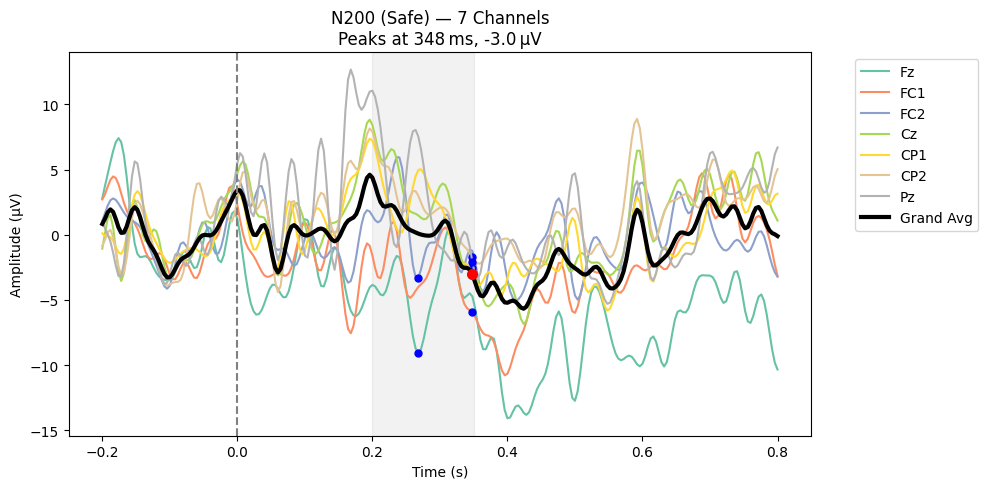

=== Safe (Event 4) N200 peaks ===
   Fz:  268.0 ms,  -9.1 µV
  FC1:  348.0 ms,  -6.0 µV
  FC2:  268.0 ms,  -3.3 µV
   Cz:  348.0 ms,  -2.5 µV
  CP1:  348.0 ms,  -3.1 µV
  CP2:  348.0 ms,  -1.7 µV
   Pz:  348.0 ms,  -2.1 µV
Grand:  348.0 ms,  -3.0 µV


Plotting topomap for Safe at 348.0 ms


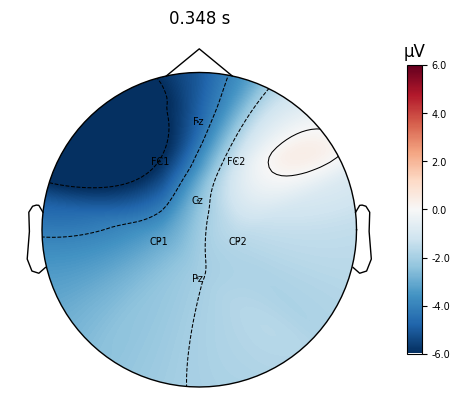

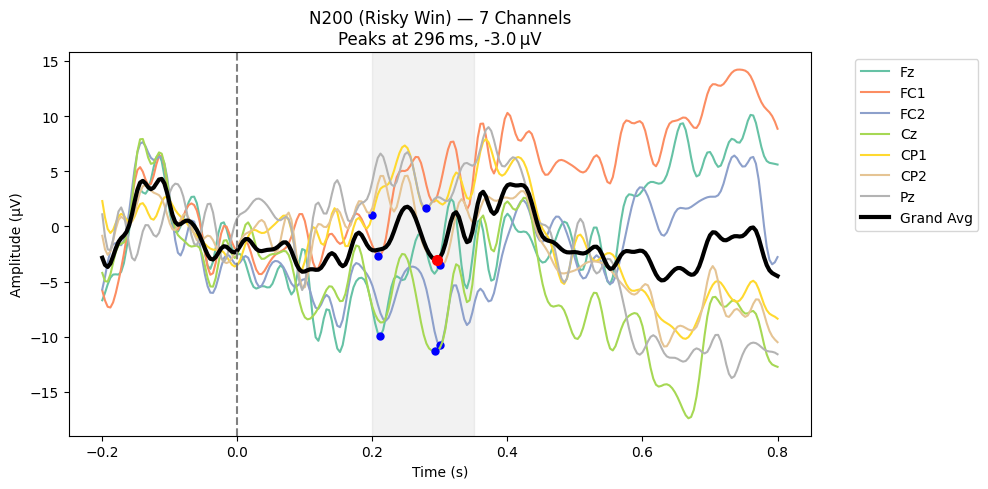

=== Risky Win (Event 5) N200 peaks ===
   Fz:  212.0 ms,  -9.9 µV
  FC1:  208.0 ms,  -2.6 µV
  FC2:  300.0 ms, -10.8 µV
   Cz:  292.0 ms, -11.3 µV
  CP1:  200.0 ms,   1.0 µV
  CP2:  300.0 ms,  -3.5 µV
   Pz:  280.0 ms,   1.6 µV
Grand:  296.0 ms,  -3.0 µV


Plotting topomap for Risky Win at 296.0 ms


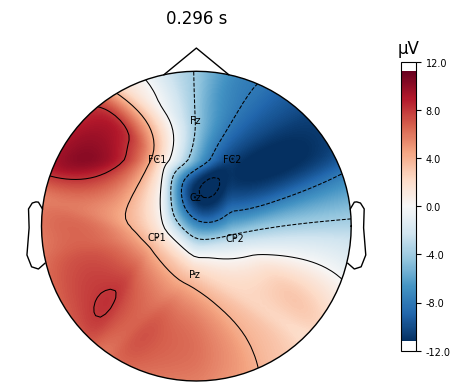

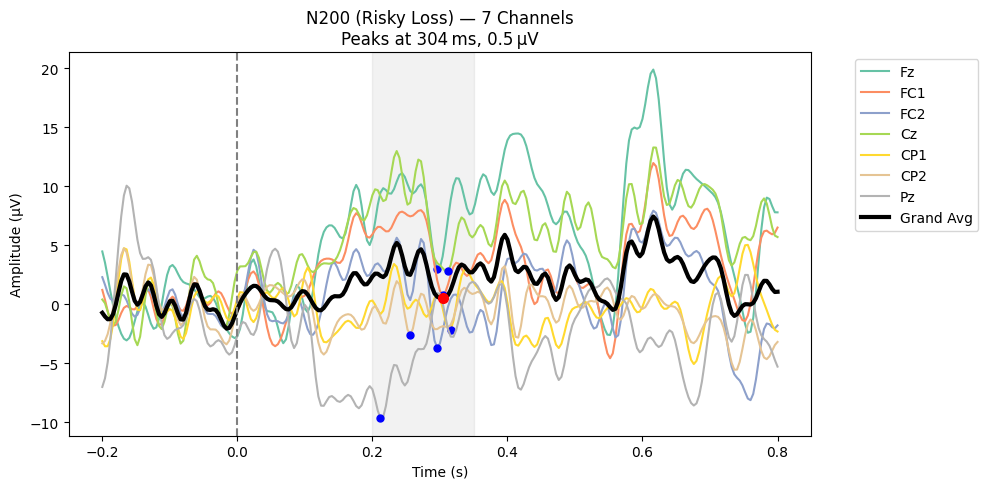

=== Risky Loss (Event 6) N200 peaks ===
   Fz:  296.0 ms,   3.0 µV
  FC1:  304.0 ms,   0.8 µV
  FC2:  296.0 ms,  -3.7 µV
   Cz:  312.0 ms,   2.8 µV
  CP1:  316.0 ms,  -2.1 µV
  CP2:  256.0 ms,  -2.6 µV
   Pz:  212.0 ms,  -9.7 µV
Grand:  304.0 ms,   0.5 µV


Plotting topomap for Risky Loss at 304.0 ms


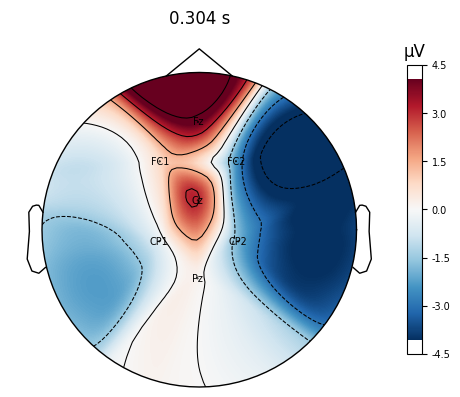

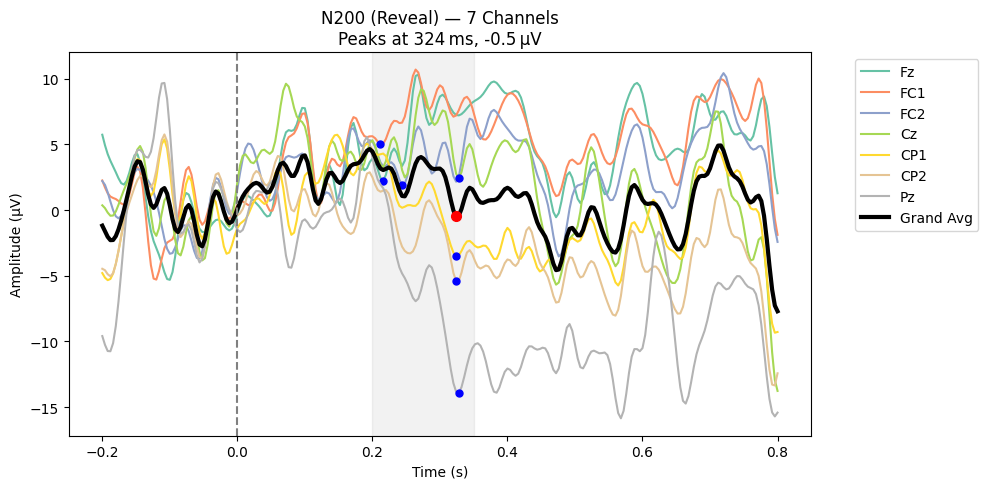

=== Reveal (Event 7) N200 peaks ===
   Fz:  216.0 ms,   2.2 µV
  FC1:  212.0 ms,   5.0 µV
  FC2:  244.0 ms,   1.9 µV
   Cz:  328.0 ms,   2.4 µV
  CP1:  324.0 ms,  -3.5 µV
  CP2:  324.0 ms,  -5.4 µV
   Pz:  328.0 ms, -13.9 µV
Grand:  324.0 ms,  -0.5 µV


Plotting topomap for Reveal at 324.0 ms


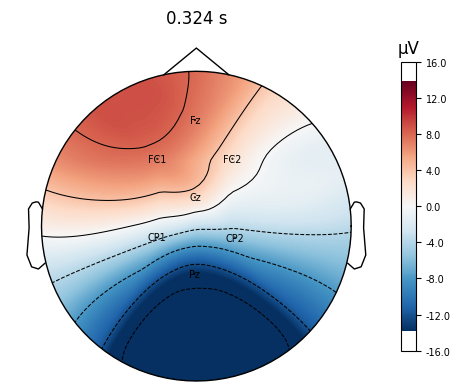

In [11]:

# N200 epochs bin 1 7 eelctrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
   
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Fz','FC1','FC2','Cz','CP1','CP2','Pz']
   
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))


import matplotlib.pyplot as plt
import numpy as np
import mne

# 1. Define your event bins and channel sets
event_bins = {
    4: 'Safe',
    5: 'Risky Win',
    6: 'Risky Loss',
    7: 'Reveal'
}

chs7 = ['Fz','FC1','FC2','Cz','CP1','CP2','Pz']
chs4 = ['Fz','Cz','FC1','FC2']

# 2. N200 time window (in seconds)
tmin, tmax = 0.2, 0.35

# 3. Prepare a color map
colors = plt.cm.Set2(np.linspace(0, 1, len(chs7)))




# 4. Loop over each event type
for event_id, name in event_bins.items():
    # pick only epochs for this marker
    epochs_bin = n200_epochs[event_id].copy().pick(chs7)  # or epochs['4'] etc.
    
    # average to get an Evoked
    evoked = epochs_bin.average()
    times = evoked.times
    data = evoked.data * 1e6   # shape (n_chs, n_times)
    
    # 1) Per‐channel N200 peaks (negative deflections)
    pk_times = {}
    pk_amps  = {}
    
    mask = (times >= tmin) & (times <= tmax)
    win_times = times[mask]
    
    plt.figure(figsize=(10, 5))
    for idx, ch in enumerate(chs7):
        wv = data[idx]
        win_wv = wv[mask]
        # find negative peak
        pk_idx = np.argmin(win_wv)
        pk_t   = win_times[pk_idx]
        pk_a   = win_wv[pk_idx]
        pk_times[ch] = pk_t
        pk_amps[ch]  = pk_a
        
        # plot waveform + marker
        plt.plot(times, wv, label=ch, color=colors[idx], lw=1.5)
        plt.plot(pk_t, pk_a, 'o', color='blue', ms=5)
    
    # 2) Grand average across the 7 channels
    grand = data.mean(axis=0)
    grand_win = grand[mask]
    g_idx = np.argmin(grand_win)
    g_t   = win_times[g_idx]
    g_a   = grand_win[g_idx]
    
    plt.plot(times, grand, color='k', lw=3, label='Grand Avg')
    plt.plot(g_t, g_a, 'o', color='red', ms=7)
    
    # 3) Beautify
    plt.axvline(0, color='gray', ls='--')
    plt.axvspan(tmin, tmax, color='gray', alpha=0.1)
    plt.title(f'N200 ({name}) — 7 Channels\nPeaks at {int(g_t*1e3)} ms, {g_a:.1f} µV')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # 4) Print out the per‐channel peaks
    print(f"=== {name} (Event {event_id}) N200 peaks ===")
    for ch in chs7:
        print(f"  {ch:>3}: {pk_times[ch]*1e3:6.1f} ms, {pk_amps[ch]:5.1f} µV")
    print(f"Grand: {g_t*1e3:6.1f} ms, {g_a:5.1f} µV\n\n")


        # 5) Plot topomap at N200 grand average peak
    print(f"Plotting topomap for {name} at {g_t*1e3:.1f} ms")

    # Create a new Evoked object for the current condition
    evoked_all = n200_epochs[event_id].average()  # average across all channels

    # Plot the topomap at the grand average N200 peak time (g_t)
    evoked_all.plot_topomap(
        times=[g_t],
        ch_type='eeg',
        size=3,
        show_names=True,
        show=True
    )


 


# If you also want the 4‑channel subset, you can simply repeat the above
# block swapping chs7 → chs4 when picking and plotting.


# 3 electrodes

Not setting metadata
200 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 200 events and 251 original time points ...
107 bad epochs dropped
Surviving epochs: 93


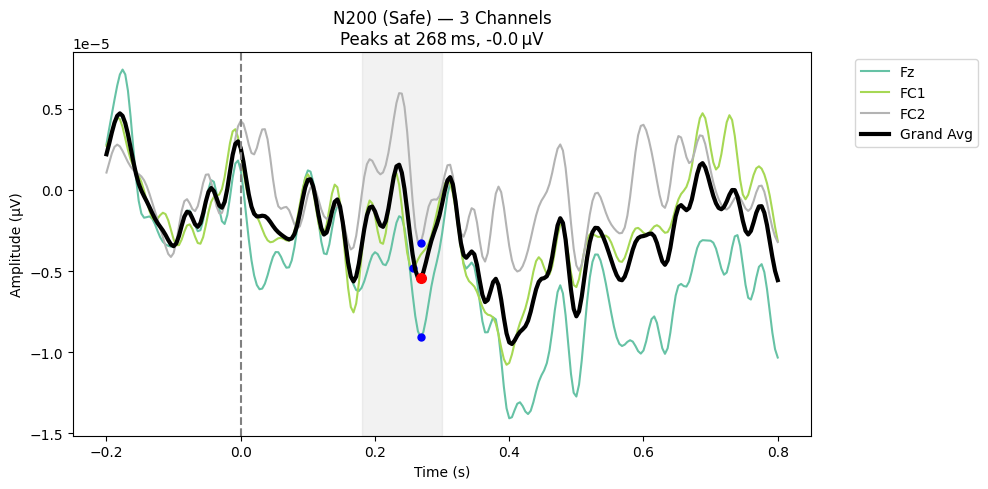

=== Safe (Event 4) N200 peaks ===
   Fz:  268.0 ms,  -0.0 µV
  FC1:  256.0 ms,  -0.0 µV
  FC2:  268.0 ms,  -0.0 µV
Grand:  268.0 ms,  -0.0 µV


Plotting topomap for Safe at 268.0 ms


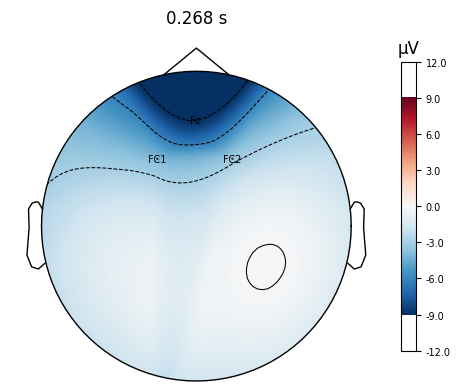

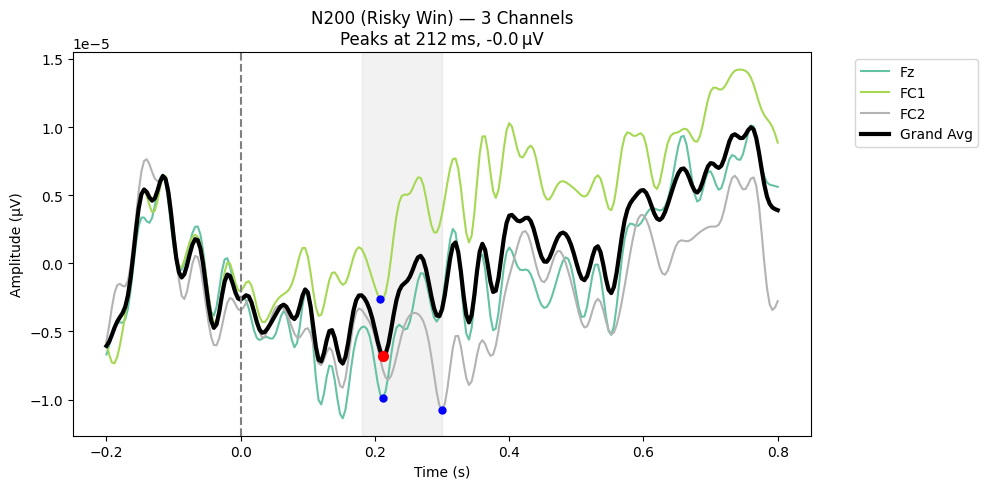

=== Risky Win (Event 5) N200 peaks ===
   Fz:  212.0 ms,  -0.0 µV
  FC1:  208.0 ms,  -0.0 µV
  FC2:  300.0 ms,  -0.0 µV
Grand:  212.0 ms,  -0.0 µV


Plotting topomap for Risky Win at 212.0 ms


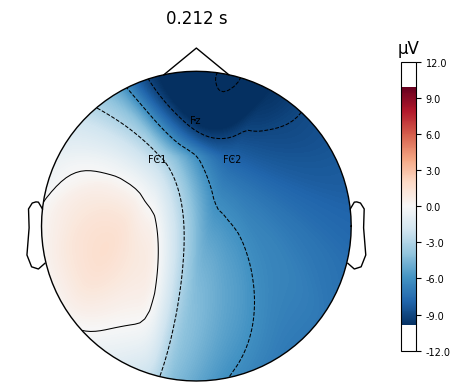

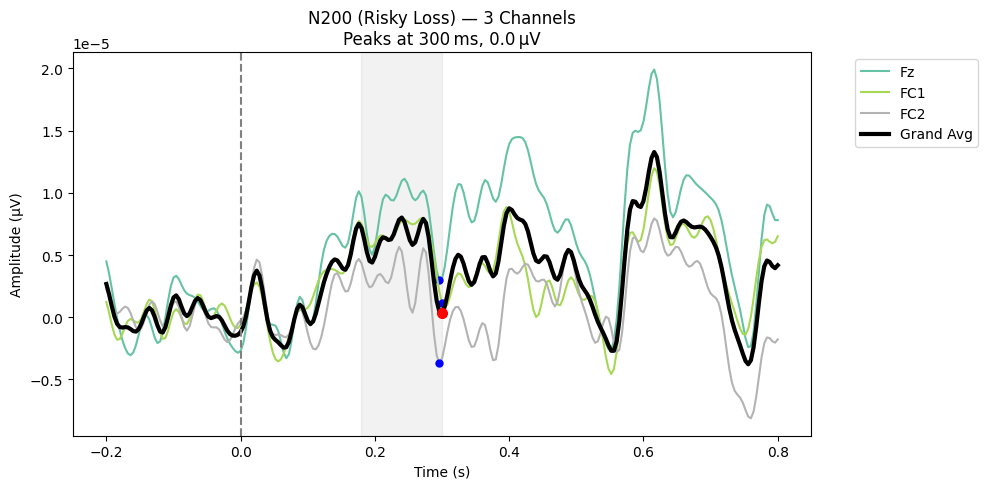

=== Risky Loss (Event 6) N200 peaks ===
   Fz:  296.0 ms,   0.0 µV
  FC1:  300.0 ms,   0.0 µV
  FC2:  296.0 ms,  -0.0 µV
Grand:  300.0 ms,   0.0 µV


Plotting topomap for Risky Loss at 300.0 ms


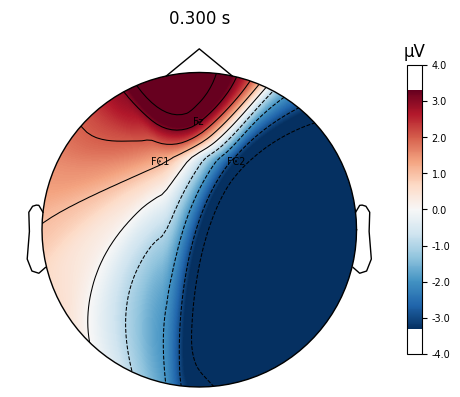

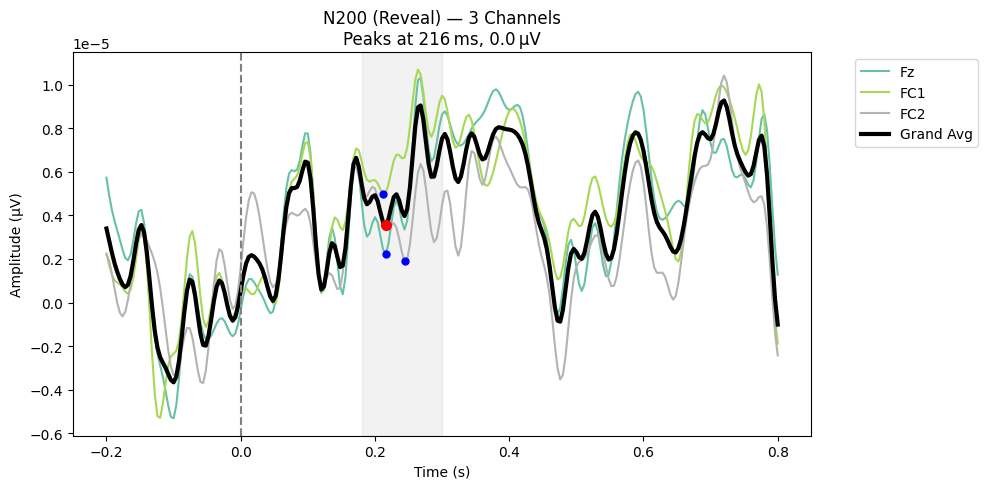

=== Reveal (Event 7) N200 peaks ===
   Fz:  216.0 ms,   0.0 µV
  FC1:  212.0 ms,   0.0 µV
  FC2:  244.0 ms,   0.0 µV
Grand:  216.0 ms,   0.0 µV


Plotting topomap for Reveal at 216.0 ms


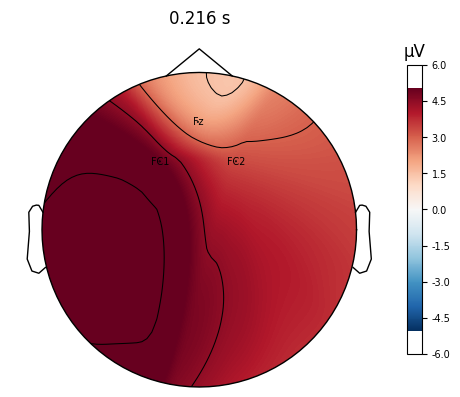

In [ ]:

# N200 epochs  3 elctrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Fz','FC1','FC2']
   
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))


import matplotlib.pyplot as plt
import numpy as np
import mne

# 1. Define your event bins and channel sets
event_bins = {
    4: 'Safe',
    5: 'Risky Win',
    6: 'Risky Loss',
    7: 'Reveal'
}


chs4 = ['Fz','FC1','FC2']

# 2. N200 time window (in seconds)
tmin, tmax = 0.18, 0.3

# 3. Prepare a color map
colors = plt.cm.Set2(np.linspace(0, 1, len(chs4)))

# 4. Loop over each event type
for event_id, name in event_bins.items():
    # pick only epochs for this marker
    epochs_bin = n200_epochs[event_id].copy().pick(chs4) 
    
    # average to get an Evoked
    evoked = epochs_bin.average()
    times = evoked.times
    data = evoked.data  # shape (n_chs, n_times)
    
    # 1) Per‐channel N200 peaks (negative deflections)
    pk_times = {}
    pk_amps  = {}
    
    mask = (times >= tmin) & (times <= tmax)
    win_times = times[mask]
    
    plt.figure(figsize=(10, 5))
    for idx, ch in enumerate(chs4):
        wv = data[idx]
        win_wv = wv[mask]
        # find negative peak
        pk_idx = np.argmin(win_wv)
        pk_t   = win_times[pk_idx]
        pk_a   = win_wv[pk_idx]
        pk_times[ch] = pk_t
        pk_amps[ch]  = pk_a
        
        # plot waveform + marker
        plt.plot(times, wv, label=ch, color=colors[idx], lw=1.5)
        plt.plot(pk_t, pk_a, 'o', color='blue', ms=5)
    
    # 2) Grand average across the 7 channels
    grand = data.mean(axis=0)
    grand_win = grand[mask]
    g_idx = np.argmin(grand_win)
    g_t   = win_times[g_idx]
    g_a   = grand_win[g_idx]
    
    plt.plot(times, grand, color='k', lw=3, label='Grand Avg')
    plt.plot(g_t, g_a, 'o', color='red', ms=7)
    
    # 3) Beautify
    plt.axvline(0, color='gray', ls='--')
    plt.axvspan(tmin, tmax, color='gray', alpha=0.1)
    plt.title(f'N200 ({name}) — 3 Channels\nPeaks at {int(g_t*1e3)} ms, {g_a:.1f} µV')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # 4) Print out the per‐channel peaks
    print(f"=== {name} (Event {event_id}) N200 peaks ===")
    for ch in chs4:

        
        print(f"  {ch:>3}: {pk_times[ch]*1e3:6.1f} ms, {pk_amps[ch]:5.1f} µV")
    print(f"Grand: {g_t*1e3:6.1f} ms, {g_a:5.1f} µV\n\n")


        # 5) Plot topomap at N200 grand average peak
    print(f"Plotting topomap for {name} at {g_t*1e3:.1f} ms")

    # Create a new Evoked object for the current condition
    evoked_all = n200_epochs[event_id].average()  # average across all channels

    # Plot the topomap at the grand average N200 peak time (g_t)
    evoked_all.plot_topomap(
        times=[g_t],
        ch_type='eeg',
        size=3,
        show_names=True,
        show=True
    )


 





## FRN Epochs

Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 48 events and 201 original time points ...
25 bad epochs dropped
Surviving epochs: 23


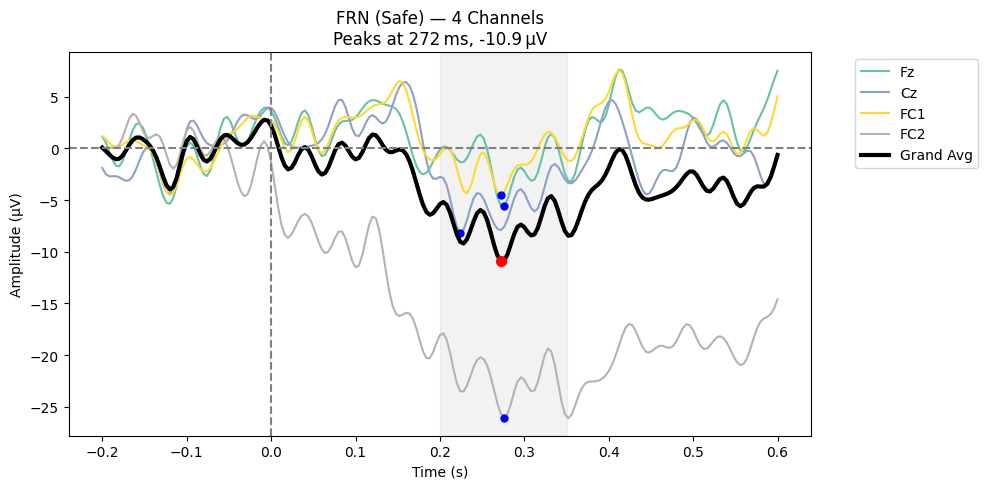

=== Safe (Event 4) FRN peaks ===
   Fz:  276.0 ms,  -5.6 µV
   Cz:  224.0 ms,  -8.1 µV
  FC1:  272.0 ms,  -4.5 µV
  FC2:  276.0 ms, -26.1 µV
Grand:  272.0 ms, -10.9 µV


Plotting topomap for Safe at 272.0 ms


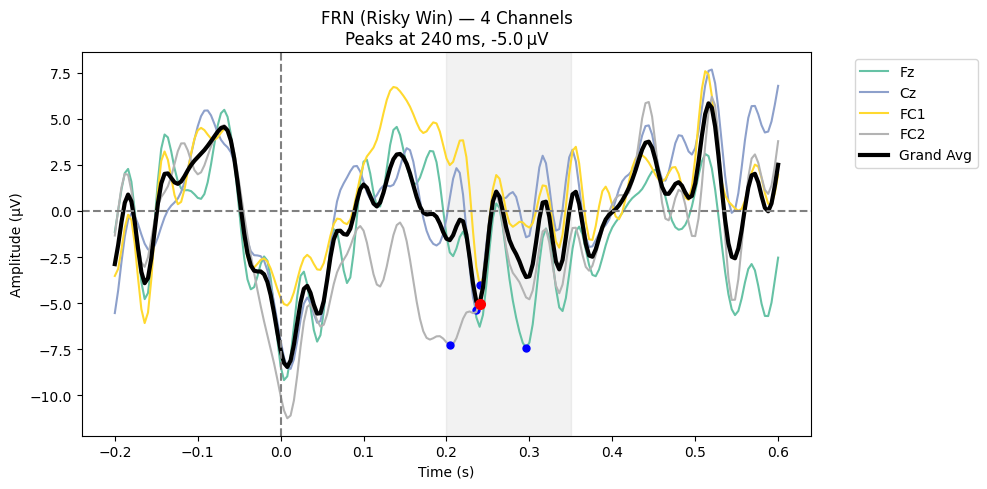

=== Risky Win (Event 5) FRN peaks ===
   Fz:  296.0 ms,  -7.4 µV
   Cz:  236.0 ms,  -5.4 µV
  FC1:  240.0 ms,  -4.0 µV
  FC2:  204.0 ms,  -7.3 µV
Grand:  240.0 ms,  -5.0 µV


Plotting topomap for Risky Win at 240.0 ms


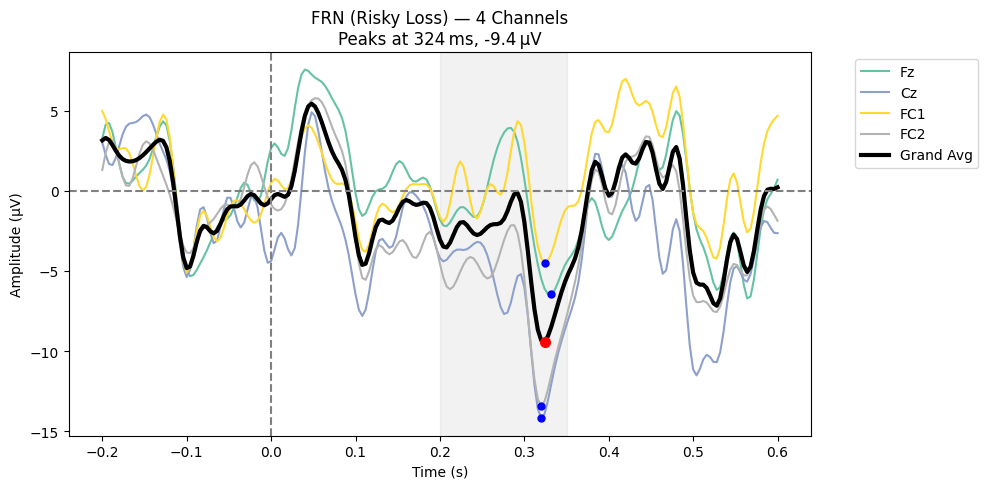

=== Risky Loss (Event 6) FRN peaks ===
   Fz:  332.0 ms,  -6.5 µV
   Cz:  320.0 ms, -14.2 µV
  FC1:  324.0 ms,  -4.5 µV
  FC2:  320.0 ms, -13.4 µV
Grand:  324.0 ms,  -9.4 µV


Plotting topomap for Risky Loss at 324.0 ms


In [16]:

# frn epochs 
frn_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[4, 5, 6],
    
    tmin=-0.2,
    tmax=0.6,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Fz', 'Cz','FC1','FC2']
   
)
frn_epochs.drop_bad()
print("Surviving epochs:", len(frn_epochs))


import matplotlib.pyplot as plt
import numpy as np
import mne

# 1. Define your event bins and channel sets
event_bins = {
    4: 'Safe',
    5: 'Risky Win',
    6: 'Risky Loss'
   
}


chs4 = ['Fz', 'Cz','FC1','FC2']

# 2. FRN time window (in seconds)
tmin, tmax = 0.2, 0.35

# 3. Prepare a color map
colors = plt.cm.Set2(np.linspace(0, 1, len(chs4)))

# 4. Loop over each event type
for event_id, name in event_bins.items():
    # pick only epochs for this marker
    epochs_bin = frn_epochs[event_id].copy().pick(chs4)  # or epochs['4'] etc.
    
    # average to get an Evoked
    evoked = epochs_bin.average()
    times = evoked.times
    data = evoked.data  * 1e6 # shape (n_chs, n_times)
    
    # 1) Per‐channel frn peaks (negative deflections)
    pk_times = {}
    pk_amps  = {}
    
    mask = (times >= tmin) & (times <= tmax)
    win_times = times[mask]
    
    plt.figure(figsize=(10, 5))
    for idx, ch in enumerate(chs4):
        wv = data[idx]
        win_wv = wv[mask]
        # find negative peak
        pk_idx = np.argmin(win_wv)
        pk_t   = win_times[pk_idx]
        pk_a   = win_wv[pk_idx]
        pk_times[ch] = pk_t
        pk_amps[ch]  = pk_a
        
        # plot waveform + marker
        plt.plot(times, wv, label=ch, color=colors[idx], lw=1.5)
        plt.plot(pk_t, pk_a, 'o', color='blue', ms=5)
    
    # 2) Grand average across the 4 channels
    grand = data.mean(axis=0)
    grand_win = grand[mask]
    g_idx = np.argmin(grand_win)
    g_t   = win_times[g_idx]
    g_a   = grand_win[g_idx]
    
    plt.plot(times, grand, color='k', lw=3, label='Grand Avg')
    plt.plot(g_t, g_a, 'o', color='red', ms=7)
    
    # 3) Beautify
    plt.axvline(0, color='gray', ls='--')
    plt.axhline(0, color='gray', ls='--')  
    plt.axvspan(tmin, tmax, color='gray', alpha=0.1)
    plt.title(f'FRN ({name}) — 4 Channels\nPeaks at {int(g_t*1e3)} ms, {g_a:.1f} µV')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # 4) Print out the per‐channel peaks
    print(f"=== {name} (Event {event_id}) FRN peaks ===")
    for ch in chs4:
        print(f"  {ch:>3}: {pk_times[ch]*1e3:6.1f} ms, {pk_amps[ch]:5.1f} µV")
    print(f"Grand: {g_t*1e3:6.1f} ms, {g_a:5.1f} µV\n\n")


        # 5) Plot topomap at FRN grand average peak
    print(f"Plotting topomap for {name} at {g_t*1e3:.1f} ms")

    # # Create a new Evoked object for the current condition
    # evoked_all = frn_epochs[event_id].average()  # average across all channels

    # # Plot the topomap at the grand average FRN peak time (g_t)
    # evoked_all.plot_topomap(
    #     times=[g_t],
    #     ch_type='eeg',
    #     size=3,
    #     show_names=True,
    #     show=True
    # )


 





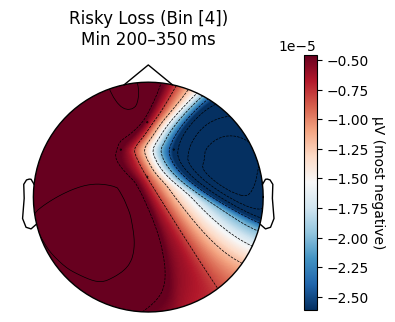

In [ ]:
tmin_avg, tmax_avg = 0.2, 0.35


    # 1) get your evoked & crop to the window
ev = frn_epochs[event_id].copy().pick(chs4).average()
ev_crop = ev.copy().crop(tmin_avg, tmax_avg)
    
    # 2) compute each channel’s minimum (most negative) amplitude
data_win   = ev_crop.data          # shape (4, n_times)
data_min   = data_win.min(axis=1)  # one value per channel, in µV
    
    # 3) set color‐limits so zero is at the top of the scale
vmin = np.min(data_min)  # e.g. around -10 to -30 µV
vmax = np.max(data_min)               # so white/neutral is at 0 µV
    
    # 4) plot with a diverging map so negative = blue, zero = white/red
fig, ax = plt.subplots(figsize=(4, 4))
im, cn = mne.viz.plot_topomap(
    data_min,
    ev.info,
    axes=ax,
    contours=10,
    vlim=(vmin, vmax),
    cmap='RdBu_r',   # red–white–blue reversed: blue=most negative
    sensors=True,
    sphere=0.10,
    show=False
)
ax.set_title(f"{name} (Bin {event_id})\nMin {int(tmin_avg*1e3)}–{int(tmax_avg*1e3)} ms")
cbar = plt.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('µV (most negative)', rotation=270, labelpad=12)
plt.tight_layout()
plt.show()

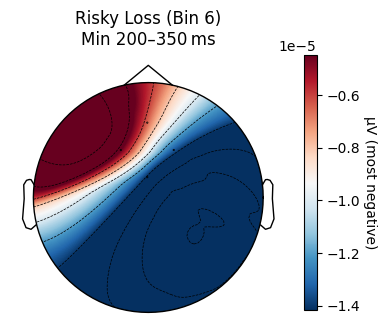

In [ ]:
import matplotlib.pyplot as plt
import mne
import numpy as np

event_bins  = {4: 'Safe', 5: 'Risky Win', 6: 'Risky Loss'}
chs4        = ['Fz', 'Cz', 'FC1', 'FC2']
tmin_avg, tmax_avg = 0.2, 0.35


    # 1) get your evoked & crop to the window
ev      = frn_epochs[event_id].copy().pick(chs4).average()
ev_crop = ev.copy().crop(tmin_avg, tmax_avg)
    
    # 2) compute each channel’s minimum (most negative) amplitude
data_win   = ev_crop.data          # shape (4, n_times)
data_min   = data_win.min(axis=1)  # one value per channel, in µV
    
    # 3) set color‐limits so zero is at the top of the scale
vmin = np.min(data_min)  # e.g. around -10 to -30 µV
vmax = np.max(data_min)               # so white/neutral is at 0 µV
    
    # 4) plot with a diverging map so negative = blue, zero = white/red
fig, ax = plt.subplots(figsize=(4, 4))
im, cn = mne.viz.plot_topomap(
    data_min,
    ev.info,
    axes=ax,
    contours=10,
    vlim=(vmin, vmax),
    cmap='RdBu_r',   # red–white–blue reversed: blue=most negative
    sensors=True,
    sphere=0.10,
    show=False
    )
ax.set_title(f"{name} (Bin {event_id})\nMin {int(tmin_avg*1e3)}–{int(tmax_avg*1e3)} ms")
cbar = plt.colorbar(im, ax=ax, shrink=0.7)
cbar.set_label('µV (most negative)', rotation=270, labelpad=12)
plt.tight_layout()
plt.show()


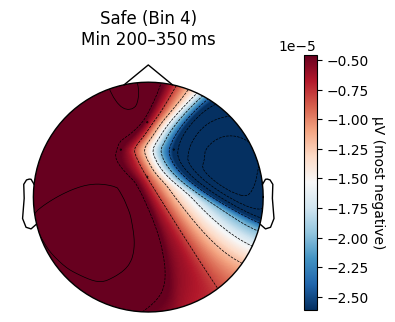

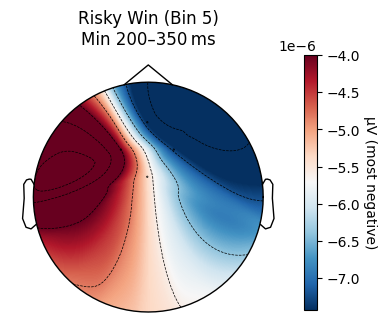

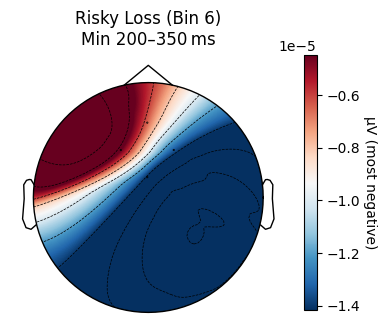

In [13]:
import matplotlib.pyplot as plt
import mne
import numpy as np

event_bins  = {4: 'Safe', 5: 'Risky Win', 6: 'Risky Loss'}
chs4        = ['Fz', 'Cz', 'FC1', 'FC2']
tmin_avg, tmax_avg = 0.2, 0.35

for event_id, name in event_bins.items():
    # 1) get your evoked & crop to the window
    ev      = frn_epochs[event_id].copy().pick(chs4).average()
    ev_crop = ev.copy().crop(tmin_avg, tmax_avg)
    
    # 2) compute each channel’s minimum (most negative) amplitude
    data_win   = ev_crop.data          # shape (4, n_times)
    data_min   = data_win.min(axis=1)  # one value per channel, in µV
    
    # 3) set color‐limits so zero is at the top of the scale
    vmin = np.min(data_min)  # e.g. around -10 to -30 µV
    vmax = np.max(data_min)               # so white/neutral is at 0 µV
    
    # 4) plot with a diverging map so negative = blue, zero = white/red
    fig, ax = plt.subplots(figsize=(4, 4))
    im, cn = mne.viz.plot_topomap(
        data_min,
        ev.info,
        axes=ax,
        contours=10,
        vlim=(vmin, vmax),
        cmap='RdBu_r',   # red–white–blue reversed: blue=most negative
        sensors=True,
        sphere=0.10,
        show=False
    )
    ax.set_title(f"{name} (Bin {event_id})\nMin {int(tmin_avg*1e3)}–{int(tmax_avg*1e3)} ms")
    cbar = plt.colorbar(im, ax=ax, shrink=0.7)
    cbar.set_label('µV (most negative)', rotation=270, labelpad=12)
    plt.tight_layout()
    plt.show()


Not setting metadata
48 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 48 events and 201 original time points ...
25 bad epochs dropped
Surviving epochs: 23


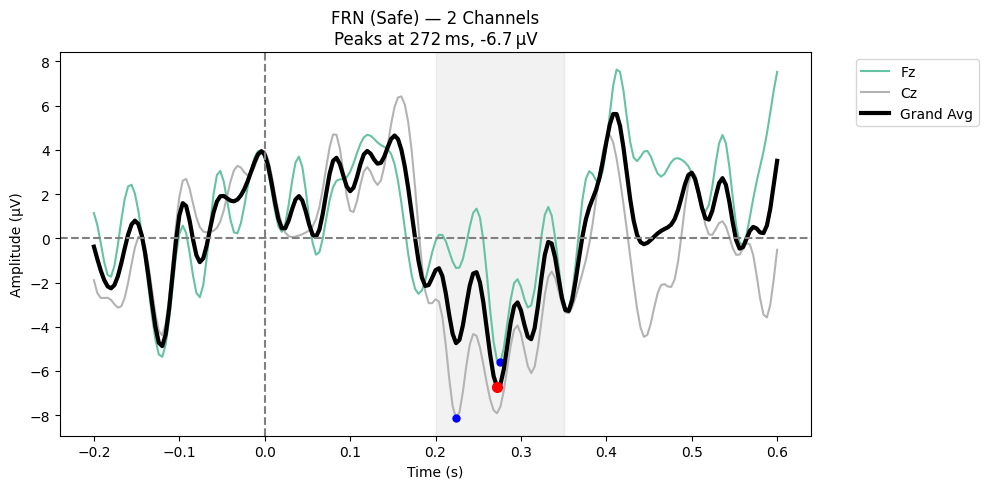

=== Safe (Event 4) FRN peaks ===
   Fz:  276.0 ms,  -5.6 µV
   Cz:  224.0 ms,  -8.1 µV
Grand:  272.0 ms,  -6.7 µV


Plotting topomap for Safe at 272.0 ms


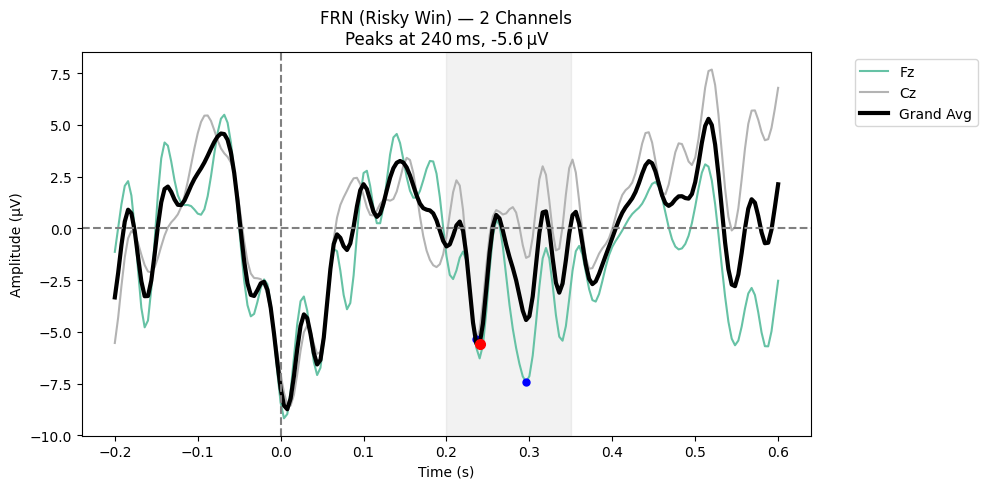

=== Risky Win (Event 5) FRN peaks ===
   Fz:  296.0 ms,  -7.4 µV
   Cz:  236.0 ms,  -5.4 µV
Grand:  240.0 ms,  -5.6 µV


Plotting topomap for Risky Win at 240.0 ms


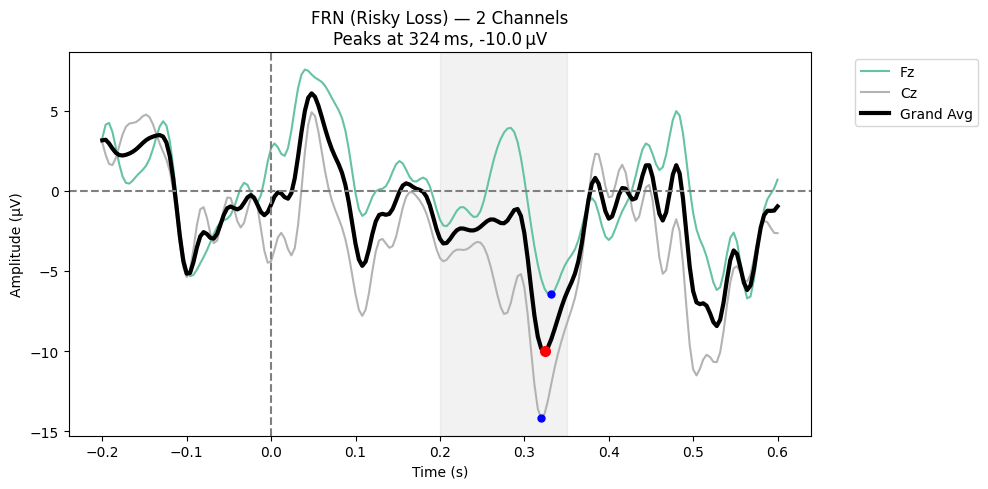

=== Risky Loss (Event 6) FRN peaks ===
   Fz:  332.0 ms,  -6.5 µV
   Cz:  320.0 ms, -14.2 µV
Grand:  324.0 ms, -10.0 µV


Plotting topomap for Risky Loss at 324.0 ms


In [10]:

# FRN epochs 
frn_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[4, 5, 6],
    tmin=-0.2,
    tmax=0.6,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Fz', 'Cz']
   
)
frn_epochs.drop_bad()
print("Surviving epochs:", len(frn_epochs))


import matplotlib.pyplot as plt
import numpy as np
import mne

# 1. Define your event bins and channel sets
event_bins = {
    4: 'Safe',
    5: 'Risky Win',
    6: 'Risky Loss'
   
}


chs2 = ['Fz', 'Cz']

# 2. FRN time window (in seconds)
tmin, tmax = 0.2, 0.35

# 3. Prepare a color map
colors = plt.cm.Set2(np.linspace(0, 1, len(chs2)))

# 4. Loop over each event type
for event_id, name in event_bins.items():
    # pick only epochs for this marker
    epochs_bin = frn_epochs[event_id].copy().pick(chs2)  
    
    # average to get an Evoked
    evoked = epochs_bin.average()
    times = evoked.times
    data = evoked.data  * 1e6 # shape (n_chs, n_times)
    
    # 1) Per‐channel frn peaks (negative deflections)
    pk_times = {}
    pk_amps  = {}
    
    mask = (times >= tmin) & (times <= tmax)
    win_times = times[mask]
    
    plt.figure(figsize=(10, 5))
    for idx, ch in enumerate(chs2):
        wv = data[idx]
        win_wv = wv[mask]
        # find negative peak
        pk_idx = np.argmin(win_wv)
        pk_t   = win_times[pk_idx]
        pk_a   = win_wv[pk_idx]
        pk_times[ch] = pk_t
        pk_amps[ch]  = pk_a
        
        # plot waveform + marker
        plt.plot(times, wv, label=ch, color=colors[idx], lw=1.5)
        plt.plot(pk_t, pk_a, 'o', color='blue', ms=5)
    
    # 2) Grand average across the 2 channels
    grand = data.mean(axis=0)
    grand_win = grand[mask]
    g_idx = np.argmin(grand_win)
    g_t   = win_times[g_idx]
    g_a   = grand_win[g_idx]
    
    plt.plot(times, grand, color='k', lw=3, label='Grand Avg')
    plt.plot(g_t, g_a, 'o', color='red', ms=7)
    
    # 3) Beautify
    plt.axvline(0, color='gray', ls='--')
    plt.axhline(0, color='gray', ls='--')
    plt.axvspan(tmin, tmax, color='gray', alpha=0.1)
    plt.title(f'FRN ({name}) — 2 Channels\nPeaks at {int(g_t*1e3)} ms, {g_a:.1f} µV')
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude (µV)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
    
    # 4) Print out the per‐channel peaks
    print(f"=== {name} (Event {event_id}) FRN peaks ===")
    for ch in chs2:
        print(f"  {ch:>3}: {pk_times[ch]*1e3:6.1f} ms, {pk_amps[ch]:5.1f} µV")
    print(f"Grand: {g_t*1e3:6.1f} ms, {g_a:5.1f} µV\n\n")


        # 5) Plot topomap at FRN grand average peak
    print(f"Plotting topomap for {name} at {g_t*1e3:.1f} ms")

    # Create a new Evoked object for the current condition
    # evoked_all = frn_epochs[event_id].average()  # average across all channels

    # # Plot the topomap at the grand average FRN peak time (g_t)
    # evoked_all.plot_topomap(
    #     times=[g_t],
    #     ch_type='eeg',
    #     size=3,
    #     show_names=True,
    #     show=True
    # )


 





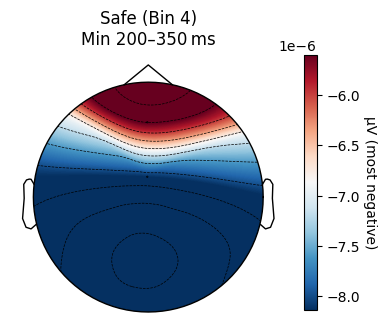

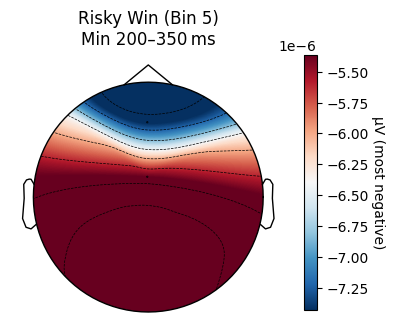

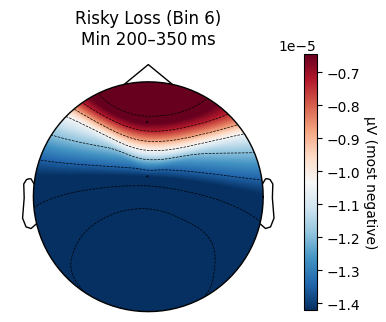

In [11]:
import matplotlib.pyplot as plt
import mne
import numpy as np

event_bins  = {4: 'Safe', 5: 'Risky Win', 6: 'Risky Loss'}
chs4        = ['Fz', 'Cz']
tmin_avg, tmax_avg = 0.2, 0.35

for event_id, name in event_bins.items():
    # 1) get your evoked & crop to the window
    ev      = frn_epochs[event_id].copy().pick(chs4).average()
    ev_crop = ev.copy().crop(tmin_avg, tmax_avg)
    
    # 2) compute each channel’s minimum (most negative) amplitude
    data_win   = ev_crop.data          # shape (4, n_times)
    data_min   = data_win.min(axis=1)  # one value per channel, in µV
    
    # 3) set color‐limits so zero is at the top of the scale
    vmin = np.min(data_min)  # e.g. around -10 to -30 µV
    vmax = np.max(data_min)               # so white/neutral is at 0 µV
    
    # 4) plot with a diverging map so negative = blue, zero = white/red
    fig, ax = plt.subplots(figsize=(4, 4))
    im, cn = mne.viz.plot_topomap(
        data_min,
        ev.info,
        axes=ax,
        contours=10,
        vlim=(vmin, vmax),
        cmap='RdBu_r',   # red–white–blue reversed: blue=most negative
        sensors=True,
        sphere=0.10,
        show=False
    )
    ax.set_title(f"{name} (Bin {event_id})\nMin {int(tmin_avg*1e3)}–{int(tmax_avg*1e3)} ms")
    cbar = plt.colorbar(im, ax=ax, shrink=0.7)
    cbar.set_label('µV (most negative)', rotation=270, labelpad=12)
    plt.tight_layout()
    plt.show()


Not setting metadata
3 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 3 events and 251 original time points ...
1 bad epochs dropped
Surviving epochs: 2


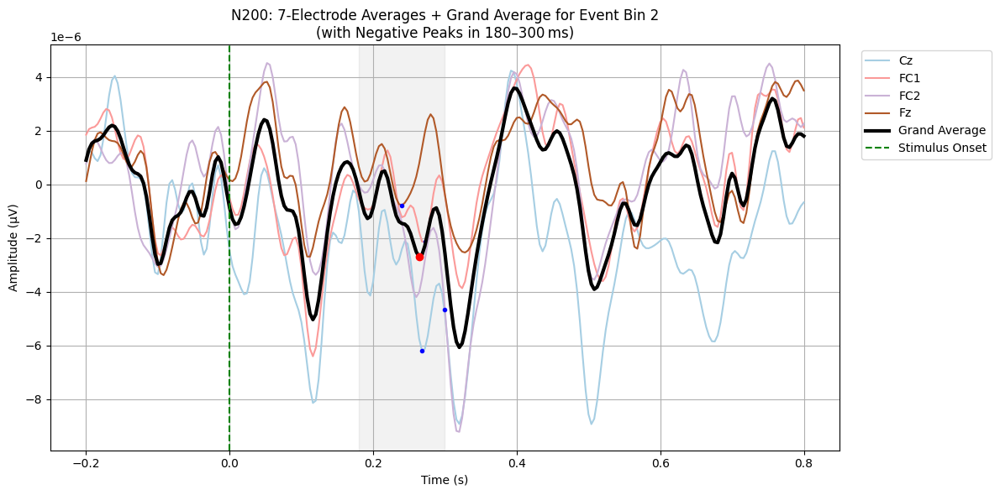

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
N200 Negative Peak: -0.00 μV at 320.0 ms


In [16]:

# N200 epochs bin 2 for 4 eelctrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[5],
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Cz','FC1','FC2','Fz']
   
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))
import matplotlib.pyplot as plt
import numpy as np

#, data loading, n200_epochs, etc. 

chans = ['Cz','FC1','FC2','Fz']
epochs9 = n200_epochs.copy().pick(chans)
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per‐channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (n_channels, n_times)

# 2) Compute grand average
grand_avg = np.mean(avg_per_chan, axis=0)

# choose a colormap
colors = plt.cm.Paired(np.linspace(0, 1, len(chans)))

plt.figure(figsize=(12, 6))

for i, ch in enumerate(chans):
    wv = avg_per_chan[i]

    # define your N200 window (e.g. 0.18–0.30 s) where you expect the negative peak
    mask = (times >= 0.18) & (times <= 0.3)
    win_t = times[mask]
    win_d = wv[mask]

    # find negative peak
    pk_idx = np.argmin(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=3)  # mark neg peak

# grand average negative peak
mask = (times >= 0.18) & (times <= 0.3)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmin(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg, color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=6)

# stimulus onset and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.18, 0.3, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('N200: 7‑Electrode Averages + Grand Average for Event Bin 2\n(with Negative Peaks in 180–300 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


# --- for the evoked N200 summary ---
evoked_n200 = n200_epochs.average()
evoked_parietal = evoked_n200.pick_channels(chans)

# crop to the same N200 window
tmin, tmax = 0.2, 0.35
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# average across channels, then find the minimum
data = evoked_window.data.mean(axis=0)
times = evoked_window.times
peak_idx = np.argmin(data)
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # ms

print(f"N200 Negative Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")


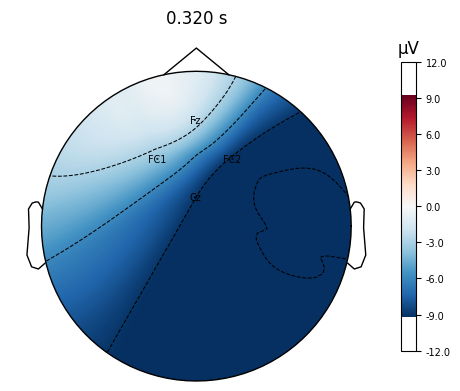

In [17]:
evoked_n200.plot_topomap(times=0.320, size=3, show=True , show_names=True);

## bin 3 for 7 electrodes

Not setting metadata
21 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 21 events and 251 original time points ...
10 bad epochs dropped
Surviving epochs: 11


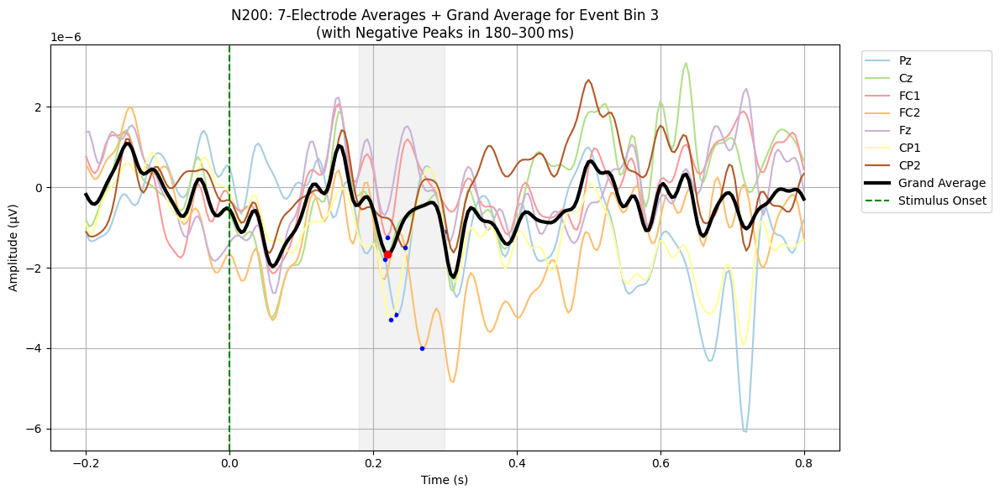

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
N200 Negative Peak: -0.00 μV at 312.0 ms


In [18]:

# N200 epochs bin 3 for  7 eelctrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[6],
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','FC1','FC2','Fz','CP1','CP2']
   
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))
import matplotlib.pyplot as plt
import numpy as np

# -data loading, n200_epochs, etc. 
chans = ['Pz','Cz','FC1','FC2','Fz','CP1','CP2']
epochs9 = n200_epochs.copy().pick(chans)
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per‐channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (n_channels, n_times)

# 2) Compute grand average
grand_avg = np.mean(avg_per_chan, axis=0)

# choose a colormap
colors = plt.cm.Paired(np.linspace(0, 1, len(chans)))

plt.figure(figsize=(12, 6))

for i, ch in enumerate(chans):
    wv = avg_per_chan[i]

    # define your N200 window (e.g. 0.18–0.30 s) where you expect the negative peak
    mask = (times >= 0.18) & (times <= 0.3)
    win_t = times[mask]
    win_d = wv[mask]

    # find negative peak
    pk_idx = np.argmin(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=3)  # mark neg peak

# grand average negative peak
mask = (times >= 0.18) & (times <= 0.3)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmin(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg, color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=6)

# stimulus onset and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.18, 0.3, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('N200: 7‑Electrode Averages + Grand Average for Event Bin 3\n(with Negative Peaks in 180–300 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()




# --- for the evoked N200 summary ---
evoked_n200 = n200_epochs.average()
evoked_parietal = evoked_n200.pick_channels(chans)

# crop to the same N200 window
tmin, tmax = 0.2, 0.35
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# average across channels, then find the minimum
data = evoked_window.data.mean(axis=0)
times = evoked_window.times
peak_idx = np.argmin(data)
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # ms

print(f"N200 Negative Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")


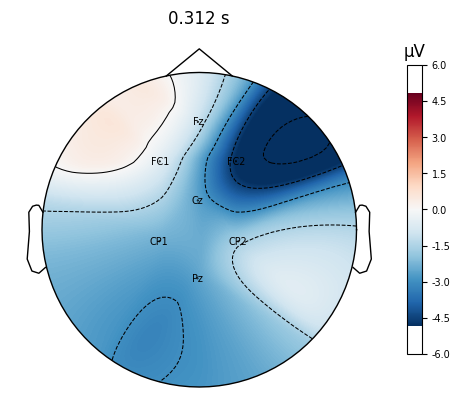

In [19]:
evoked_n200.plot_topomap(times=0.312, size=3, show=True, show_names=True);

## Bin 3 for 4 electrodes 

Not setting metadata
21 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 21 events and 251 original time points ...
10 bad epochs dropped
Surviving epochs: 11


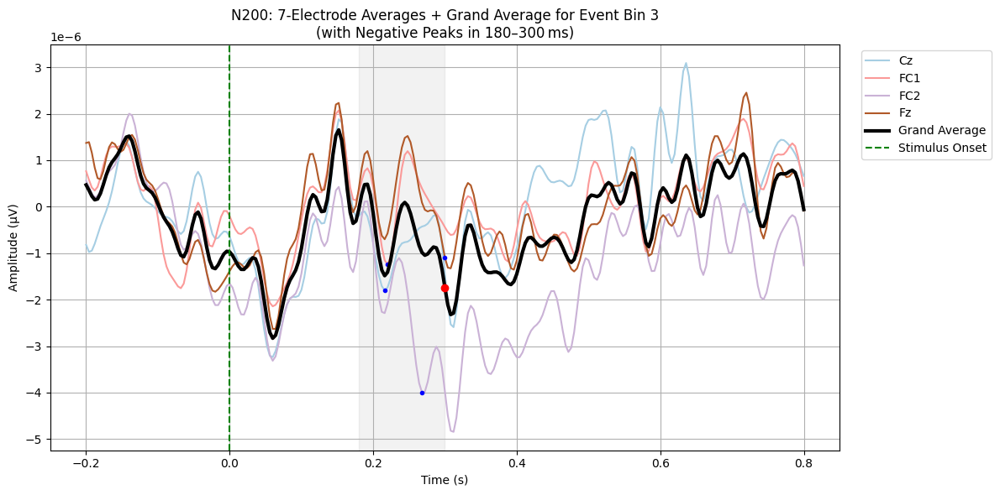

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
N200 Negative Peak: -0.00 μV at 308.0 ms


In [20]:

# N200 epochs bin 3 for 4 eelctrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[6],
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Cz','FC1','FC2','Fz']
   
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))
import matplotlib.pyplot as plt
import numpy as np

#, data loading, n200_epochs, etc. 

chans = ['Cz','FC1','FC2','Fz']
epochs9 = n200_epochs.copy().pick(chans)
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per‐channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (n_channels, n_times)

# 2) Compute grand average
grand_avg = np.mean(avg_per_chan, axis=0)

# choose a colormap
colors = plt.cm.Paired(np.linspace(0, 1, len(chans)))

plt.figure(figsize=(12, 6))

for i, ch in enumerate(chans):
    wv = avg_per_chan[i]

    # define your N200 window (e.g. 0.18–0.30 s) where you expect the negative peak
    mask = (times >= 0.18) & (times <= 0.3)
    win_t = times[mask]
    win_d = wv[mask]

    # find negative peak
    pk_idx = np.argmin(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=3)  # mark neg peak

# grand average negative peak
mask = (times >= 0.18) & (times <= 0.3)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmin(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg, color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=6)

# stimulus onset and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.18, 0.3, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('N200: 7‑Electrode Averages + Grand Average for Event Bin 3\n(with Negative Peaks in 180–300 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


# --- for the evoked N200 summary ---
evoked_n200 = n200_epochs.average()
evoked_parietal = evoked_n200.pick_channels(chans)

# crop to the same N200 window
tmin, tmax = 0.2, 0.35
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# average across channels, then find the minimum
data = evoked_window.data.mean(axis=0)
times = evoked_window.times
peak_idx = np.argmin(data)
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # ms

print(f"N200 Negative Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")


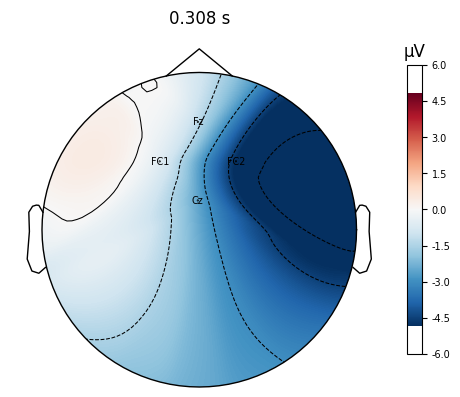

In [21]:
evoked_n200.plot_topomap(times=0.308, size=3, show=True, show_names=True);

## bin 4 for 7 electrodes 

Not setting metadata
2 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 2 events and 251 original time points ...
1 bad epochs dropped
Surviving epochs: 1


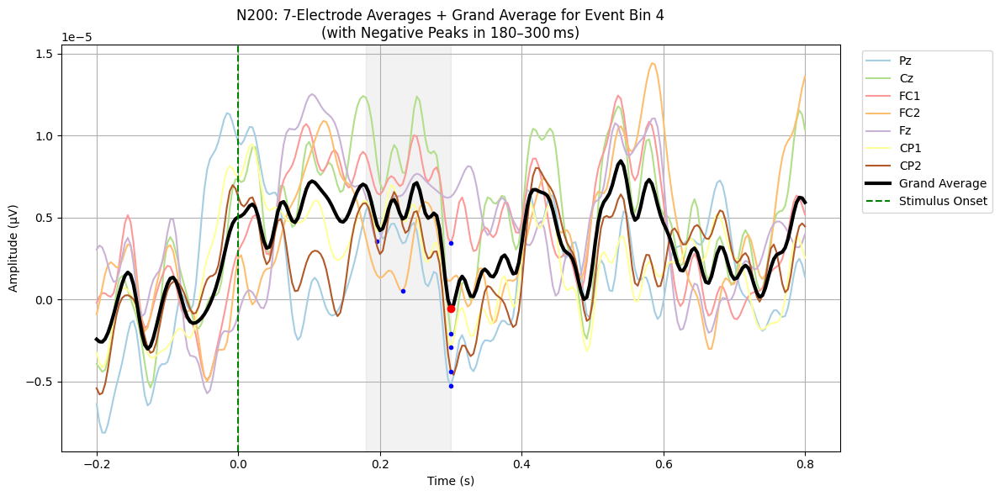

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
N200 Negative Peak: -0.00 μV at 300.0 ms


In [22]:

# N200 epochs bin 4 for  7 eelctrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[7],
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Pz','Cz','FC1','FC2','Fz','CP1','CP2']
   
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))
import matplotlib.pyplot as plt
import numpy as np

# -data loading, n200_epochs, etc. 
chans = ['Pz','Cz','FC1','FC2','Fz','CP1','CP2']
epochs9 = n200_epochs.copy().pick(chans)
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per‐channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (n_channels, n_times)

# 2) Compute grand average
grand_avg = np.mean(avg_per_chan, axis=0)

# choose a colormap
colors = plt.cm.Paired(np.linspace(0, 1, len(chans)))

plt.figure(figsize=(12, 6))

for i, ch in enumerate(chans):
    wv = avg_per_chan[i]

    # define your N200 window (e.g. 0.18–0.30 s) where you expect the negative peak
    mask = (times >= 0.18) & (times <= 0.3)
    win_t = times[mask]
    win_d = wv[mask]

    # find negative peak
    pk_idx = np.argmin(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=3)  # mark neg peak

# grand average negative peak
mask = (times >= 0.18) & (times <= 0.3)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmin(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg, color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=6)

# stimulus onset and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.18, 0.3, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('N200: 7‑Electrode Averages + Grand Average for Event Bin 4\n(with Negative Peaks in 180–300 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()




# --- for the evoked N200 summary ---
evoked_n200 = n200_epochs.average()
evoked_parietal = evoked_n200.pick_channels(chans)

# crop to the same N200 window
tmin, tmax = 0.2, 0.35
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# average across channels, then find the minimum
data = evoked_window.data.mean(axis=0)
times = evoked_window.times
peak_idx = np.argmin(data)
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # ms

print(f"N200 Negative Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")


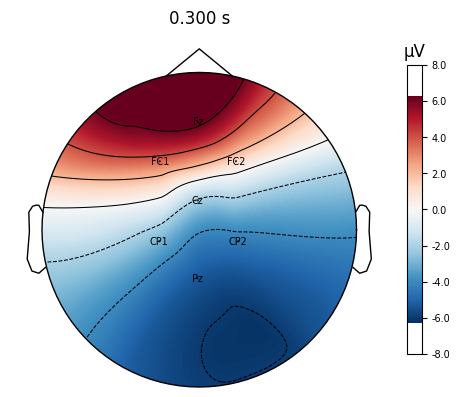

In [23]:
evoked_n200.plot_topomap(times=0.3, size=3, show=True, show_names=True);

## bin 4 for 4 electrodes 

Not setting metadata
2 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 2 events and 251 original time points ...
1 bad epochs dropped
Surviving epochs: 1


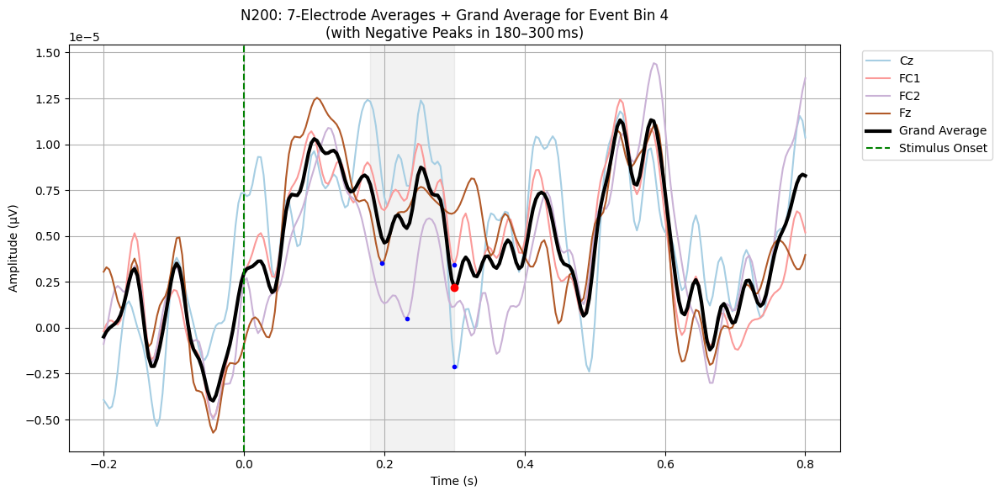

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
N200 Negative Peak: 0.00 μV at 300.0 ms


In [24]:

# N200 epochs bin 4 for 4 eelctrodes
n200_epochs = mne.Epochs(
    raw_erp_clean,
    events,
    event_id=[7],
    tmin=-0.2,
    tmax=0.8,
    baseline=(-0.2, 0),
    preload=True,
    picks=['Cz','FC1','FC2','Fz']
   
)
n200_epochs.drop_bad()
print("Surviving epochs:", len(n200_epochs))
import matplotlib.pyplot as plt
import numpy as np

#, data loading, n200_epochs, etc. 

chans = ['Cz','FC1','FC2','Fz']
epochs9 = n200_epochs.copy().pick(chans)
data = epochs9.get_data()
times = epochs9.times

# 1) Compute per‐channel average
avg_per_chan = np.mean(data, axis=0)  # shape: (n_channels, n_times)

# 2) Compute grand average
grand_avg = np.mean(avg_per_chan, axis=0)

# choose a colormap
colors = plt.cm.Paired(np.linspace(0, 1, len(chans)))

plt.figure(figsize=(12, 6))

for i, ch in enumerate(chans):
    wv = avg_per_chan[i]

    # define your N200 window (e.g. 0.18–0.30 s) where you expect the negative peak
    mask = (times >= 0.18) & (times <= 0.3)
    win_t = times[mask]
    win_d = wv[mask]

    # find negative peak
    pk_idx = np.argmin(win_d)
    pk_t = win_t[pk_idx]
    pk_a = win_d[pk_idx]

    plt.plot(times, wv, color=colors[i], linewidth=1.5, label=ch)
    plt.plot(pk_t, pk_a, 'o', color='blue', markersize=3)  # mark neg peak

# grand average negative peak
mask = (times >= 0.18) & (times <= 0.3)
win_t = times[mask]
win_d = grand_avg[mask]
g_idx = np.argmin(win_d)
g_t = win_t[g_idx]
g_a = win_d[g_idx]

plt.plot(times, grand_avg, color='black', linewidth=3, label='Grand Average')
plt.plot(g_t, g_a, 'o', color='red', markersize=6)

# stimulus onset and window shading
plt.axvline(0, color='green', linestyle='--', linewidth=1.5, label='Stimulus Onset')
plt.axvspan(0.18, 0.3, color='gray', alpha=0.1)

plt.xlabel('Time (s)')
plt.ylabel('Amplitude (μV)')
plt.title('N200: 7‑Electrode Averages + Grand Average for Event Bin 4\n(with Negative Peaks in 180–300 ms)')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


# --- for the evoked N200 summary ---
evoked_n200 = n200_epochs.average()
evoked_parietal = evoked_n200.pick_channels(chans)

# crop to the same N200 window
tmin, tmax = 0.2, 0.35
evoked_window = evoked_parietal.copy().crop(tmin, tmax)

# average across channels, then find the minimum
data = evoked_window.data.mean(axis=0)
times = evoked_window.times
peak_idx = np.argmin(data)
peak_amplitude = data[peak_idx]
peak_latency = times[peak_idx] * 1000  # ms

print(f"N200 Negative Peak: {peak_amplitude:.2f} μV at {peak_latency:.1f} ms")


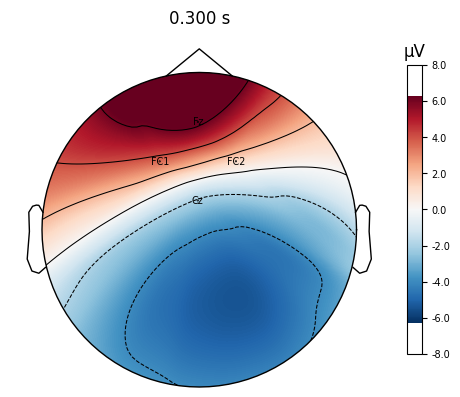

In [25]:
evoked_n200.plot_topomap(times=0.3, size=3, show=True, show_names=True);

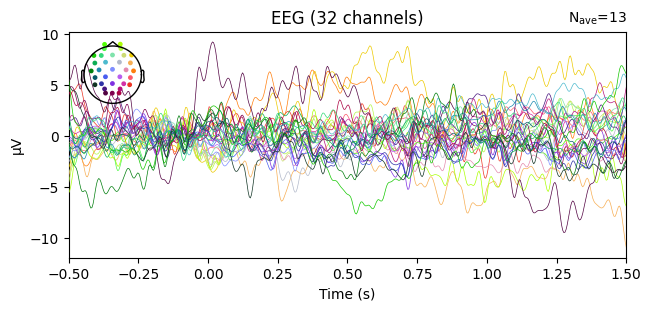

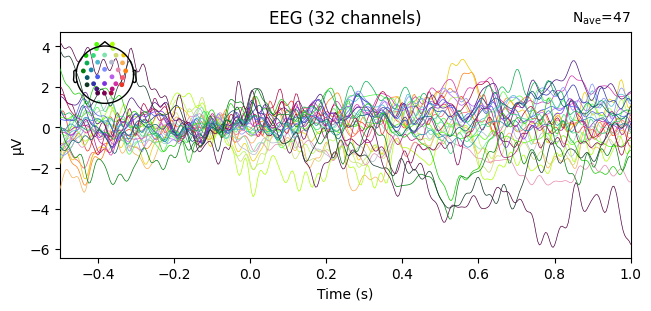

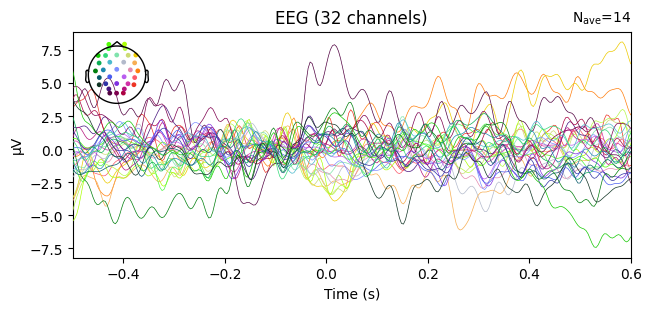

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


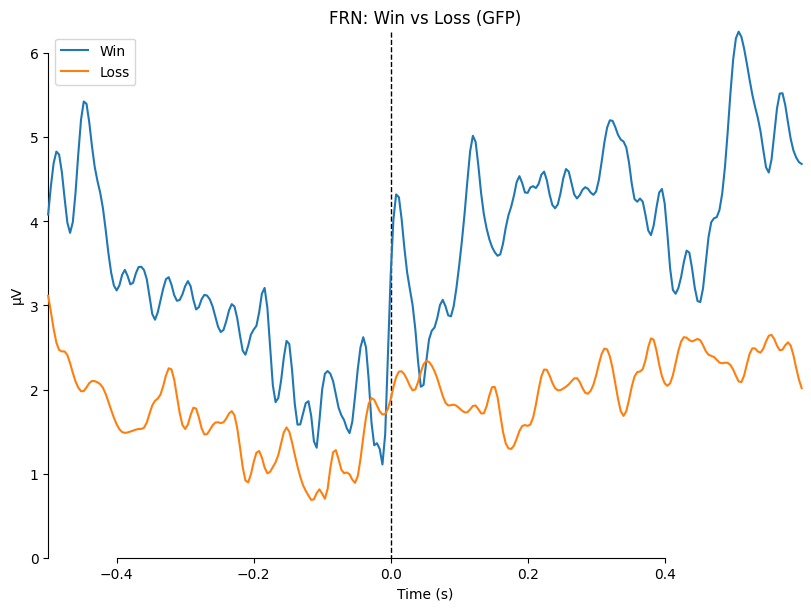

[<Figure size 800x600 with 1 Axes>]

In [9]:

# Compute evoked responses
p300_evoked = p300_epochs.average()
n200_evoked = n200_epochs.average()
frn_evoked = frn_epochs.average()

# Plot ERPs
p300_evoked.plot(spatial_colors=True, 
                window_title='P300 Evoked Response')
n200_evoked.plot(spatial_colors=True, 
                window_title='N200 Evoked Response')
frn_evoked.plot(spatial_colors=True, 
               window_title='FRN Evoked Response')

# Compare conditions
mne.viz.plot_compare_evokeds(
    {'Win': frn_epochs['5'].average(), 
     'Loss': frn_epochs['6'].average()},
    title='FRN: Win vs Loss'
)


Effective window size : 2.000 (s)


C:\Users\suryansh\AppData\Local\Temp\ipykernel_22020\4143474694.py:4: UserWarning: Zero value in spectrum for channel P8
  spectrum = raw.compute_psd(


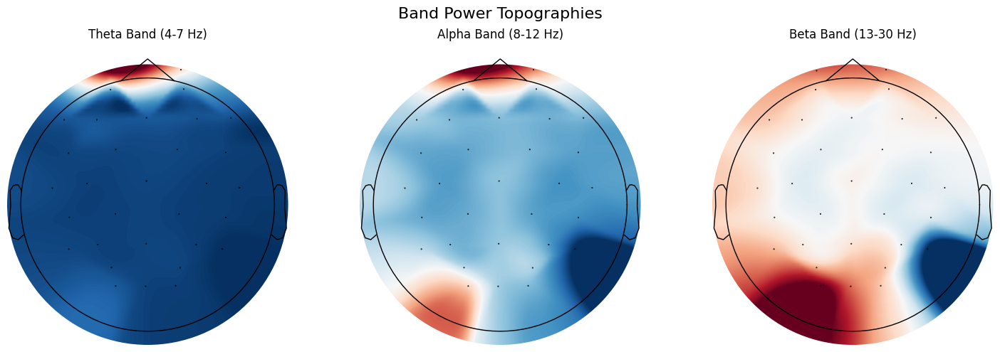

In [10]:
# 4. Time-Frequency Analysis
# ----------------------------------------------------------------
# PSD using Welch's method
spectrum = raw.compute_psd(
    method="welch",
    fmin=1,
    fmax=45,
    n_fft=int(sfreq * 2),
    n_overlap=int(sfreq)
)

# Get PSD data and frequencies
psds = spectrum.get_data()  # Shape: (n_channels, n_freqs)
freqs = spectrum.freqs

# Band definitions
bands = {
    'Theta': (4, 7),
    'Alpha': (8, 12),
    'Beta': (13, 30)
}

# Compute average power in bands
band_power = {}
for band, (fmin, fmax) in bands.items():
    # Find frequency indices in this band
    band_idx = np.where((freqs >= fmin) & (freqs <= fmax))[0]
    
    # Compute mean power across frequencies in the band
    band_power[band] = psds[:, band_idx].mean(axis=1)

# 5. Plot PSD Topomaps
# ----------------------------------------------------------------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Band Power Topographies', fontsize=16)

for ax, (band, power) in zip(axes, band_power.items()):
    mne.viz.plot_topomap(
        power,
        pos=info,
        cmap='RdBu_r',
        contours=0,
        show=False,
        axes=ax,
        sensors=True
    )
    ax.set_title(f'{band} Band ({bands[band][0]}-{bands[band][1]} Hz)')

plt.tight_layout()
plt.show()

In [ ]:

# # 4. Time-Frequency Analysis
# # ----------------------------------------------------------------
# # PSD using Welch's method
# # psds, freqs = mne.time_frequency(
# #     raw,
# #     fmin=1,
# #     method='welch',
# #     fmax=45,
# #     n_fft=int(sfreq * 2),
# #     n_overlap=int(sfreq)
# # )
# psds = raw_psd.compute_psd(
#         method="welch",
#         fmin=1,
#         fmax=45,
#         n_fft=int(sfreq * 2),
#         n_overlap=int(sfreq)
#     )

#     # Convert PSDs to dB for plotting (10 * log10(power))
#     # psds = 10 * np.log10(psd.get_data())  # PSD in dB
# freqs = psds.freqs
# # Band definitions
# bands = {
#     'Theta': (4, 7),
#     'Alpha': (8, 12),
#     'Beta': (13, 30)
# }

# # Compute average power in bands
# band_power = {}
# for band, (fmin, fmax) in bands.items():
#     band_idx = np.logical_and(freqs >= fmin, freqs <= fmax)
#     band_power[band] = psds[:, :, band_idx].mean(axis=-1)




Effective window size : 4.000 (s)


RuntimeError: Unable to access raw data (need both channels and time)

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from pathlib import Path
import mne
from mne.datasets import sample
from mne.viz import plot_alignment, set_3d_view, plot_evoked_topomap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# — prepare paths/transforms —
data_path    = Path(sample.data_path())
subjects_dir = data_path / 'subjects'
trans_fif    = data_path / 'MEG/sample/sample_audvis_raw-trans.fif'

# — 1) 3D sensor/head plot —
fig3d = plot_alignment(
    info=p300_evoked.info,
    trans=trans_fif,
    subject='sample',
    subjects_dir=subjects_dir,
    dig=True,
    surfaces='head',
    coord_frame='head',
    show_axes=True
)
set_3d_view(fig3d, azimuth=45, elevation=90, distance=0.5)

# — 2) create a tiny inset Axes for the topomap —
# we grab the current Mayavi scene’s figure canvas to find its size
canvas = fig3d.scene._renderer._window  
w, h = canvas.GetSize()

# now add an inset with normalized size and position
# (these values you can tweak)
ax_inset = inset_axes(
    plt.gca(), 
    width="20%",    # 20% of the width
    height="20%",   # 20% of the height
    loc='upper right'
)

# — 3) draw the 2D topomap into that inset —
evoked_n200(
    evoked_n200,
    times=[0.4],
    axes=ax_inset,
    show=False,
    colorbar=False,
    time_unit='s',
    ch_type='eeg'
)
ax_inset.set_title("P300 @ 400 ms", fontsize=8)
ax_inset.axis('off')

# Done!
fig3d.scene.reset_zoom()





Using pyvistaqt 3d backend.
False
For automatic theme detection, "darkdetect" has to be installed! You can install it with `pip install darkdetect`
For automatic theme detection, "darkdetect" has to be installed! You can install it with `pip install darkdetect`
Using outer_skin.surf for head surface.
Channel types::	eeg: 9


AttributeError: 'PyVistaFigure' object has no attribute 'scene'